<a href="https://colab.research.google.com/github/Anjitha-Siyambalapitiya/GAN-generated-digit-analysis-/blob/main/mnist_gan_colab.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
# Install dependencies (uncomment if running in Colab)
# !pip install torch torchvision tqdm matplotlib

import os
import pickle
import numpy as np
from tqdm import tqdm

import torch
import torch.nn as nn
import torch.optim as optim
from torch.autograd import Variable
from torchvision import datasets, transforms, utils
import matplotlib.pyplot as plt
from torchvision.utils import save_image


In [ ]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

bs = 100
z_dim = 100
image_size = 28
nc = 1
ngf = 128
ndf = 64
num_epochs = 50
lr = 0.0002
beta1 = 0.5

transform = transforms.Compose([
    transforms.ToTensor(),
    transforms.Normalize((0.5,), (0.5,))
])

train_dataset = datasets.MNIST(root="./data", train=True, transform=transform, download=True)
train_loader = torch.utils.data.DataLoader(train_dataset, batch_size=bs, shuffle=True, num_workers=2)

100%|██████████| 9.91M/9.91M [00:00<00:00, 12.8MB/s]
100%|██████████| 28.9k/28.9k [00:00<00:00, 345kB/s]
100%|██████████| 1.65M/1.65M [00:00<00:00, 3.19MB/s]
100%|██████████| 4.54k/4.54k [00:00<00:00, 5.69MB/s]


In [ ]:
class Generator(nn.Module):
    def __init__(self, z_dim=100, ngf=128, nc=1):
        super().__init__()
        self.net = nn.Sequential(
            nn.Linear(z_dim, ngf * 7 * 7),
            nn.BatchNorm1d(ngf * 7 * 7),
            nn.ReLU(True),
            nn.Unflatten(1, (ngf, 7, 7)),
            nn.ConvTranspose2d(ngf, ngf // 2, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ngf // 2),
            nn.ReLU(True),
            nn.ConvTranspose2d(ngf // 2, ngf // 4, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ngf // 4),
            nn.ReLU(True),
            nn.Conv2d(ngf // 4, nc, 3, 1, 1),
            nn.Tanh()
        )
    def forward(self, z):
        return self.net(z)

class Discriminator(nn.Module):
    def __init__(self, nc=1, ndf=64):
        super().__init__()
        self.net = nn.Sequential(
            nn.Conv2d(nc, ndf, 4, 2, 1, bias=False),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(ndf, ndf * 2, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ndf * 2),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Flatten(),
            nn.Linear((ndf * 2) * 7 * 7, 1),
            nn.Sigmoid()
        )
    def forward(self, x):
        return self.net(x)

def weights_init(m):
    classname = m.__class__.__name__
    if classname.find('Conv') != -1 or classname.find('Linear') != -1:
        try:
            nn.init.normal_(m.weight.data, 0.0, 0.02)
        except Exception:
            pass
    elif classname.find('BatchNorm') != -1:
        try:
            nn.init.normal_(m.weight.data, 1.0, 0.02)
            nn.init.constant_(m.bias.data, 0)
        except Exception:
            pass

In [ ]:
G = Generator(z_dim, ngf, nc).to(device)
D = Discriminator(nc, ndf).to(device)
G.apply(weights_init)
D.apply(weights_init)

criterion = nn.BCELoss()
optimizerD = optim.Adam(D.parameters(), lr=lr, betas=(beta1, 0.999))
optimizerG = optim.Adam(G.parameters(), lr=lr, betas=(beta1, 0.999))

real_label = 1.
fake_label = 0.

fixed_noise = Variable(torch.randn(100, z_dim).to(device))

Epoch [1/50] Loss_D(real): 0.2750 Loss_D(fake): 0.2942 Loss_G: 1.8337 Acc Real: 92.88% Acc Fake: 7.55%


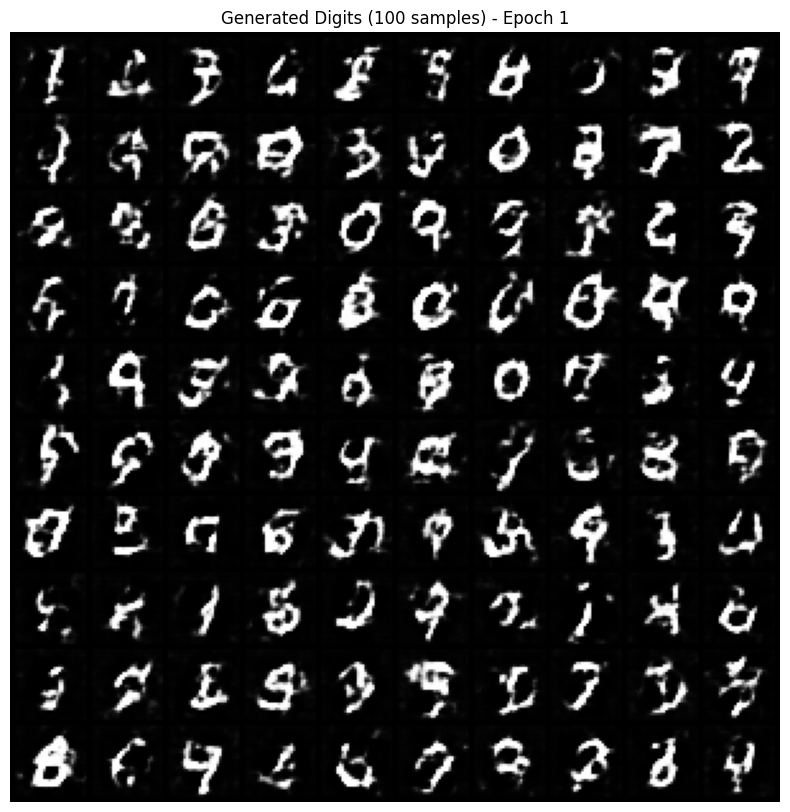

Epoch [2/50] Loss_D(real): 0.4031 Loss_D(fake): 0.3970 Loss_G: 1.5588 Acc Real: 85.83% Acc Fake: 13.50%


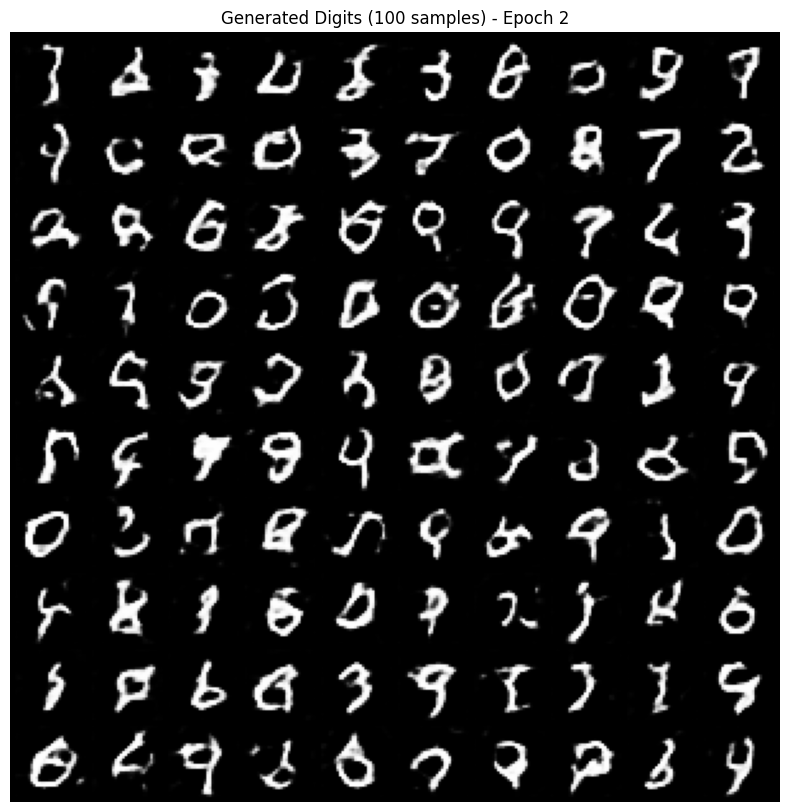

Epoch [3/50] Loss_D(real): 0.4712 Loss_D(fake): 0.4589 Loss_G: 1.3784 Acc Real: 81.10% Acc Fake: 17.98%


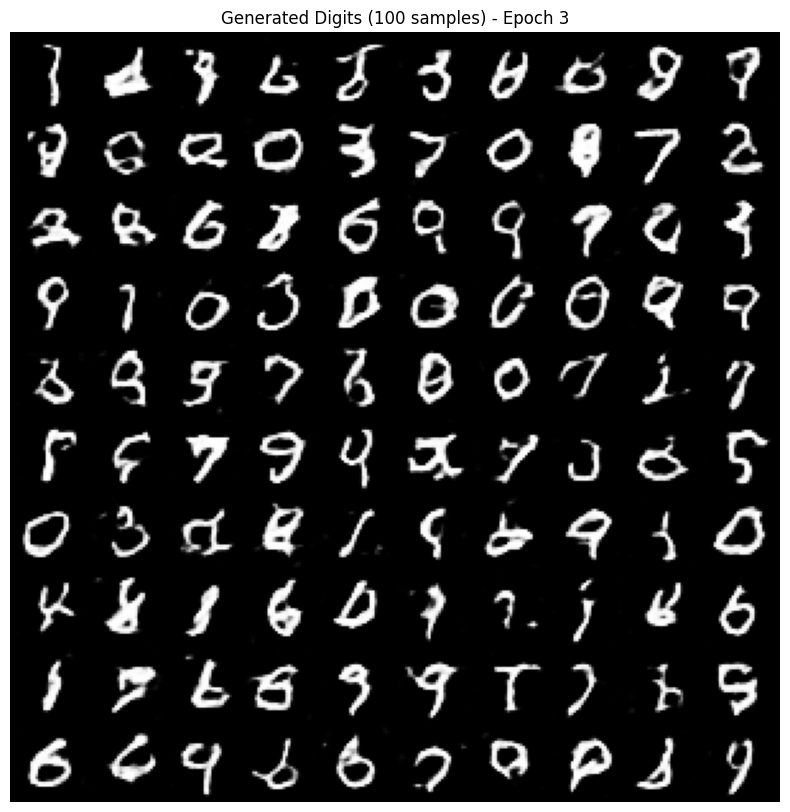

Epoch [4/50] Loss_D(real): 0.4705 Loss_D(fake): 0.4600 Loss_G: 1.3876 Acc Real: 80.19% Acc Fake: 18.25%


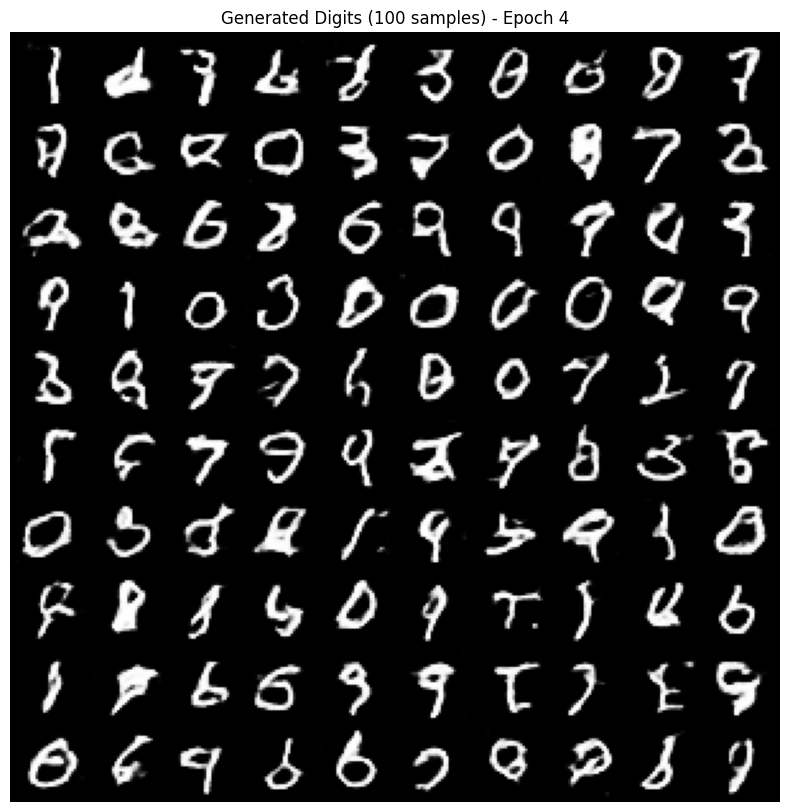

Epoch [5/50] Loss_D(real): 0.4843 Loss_D(fake): 0.4773 Loss_G: 1.3574 Acc Real: 78.81% Acc Fake: 20.22%


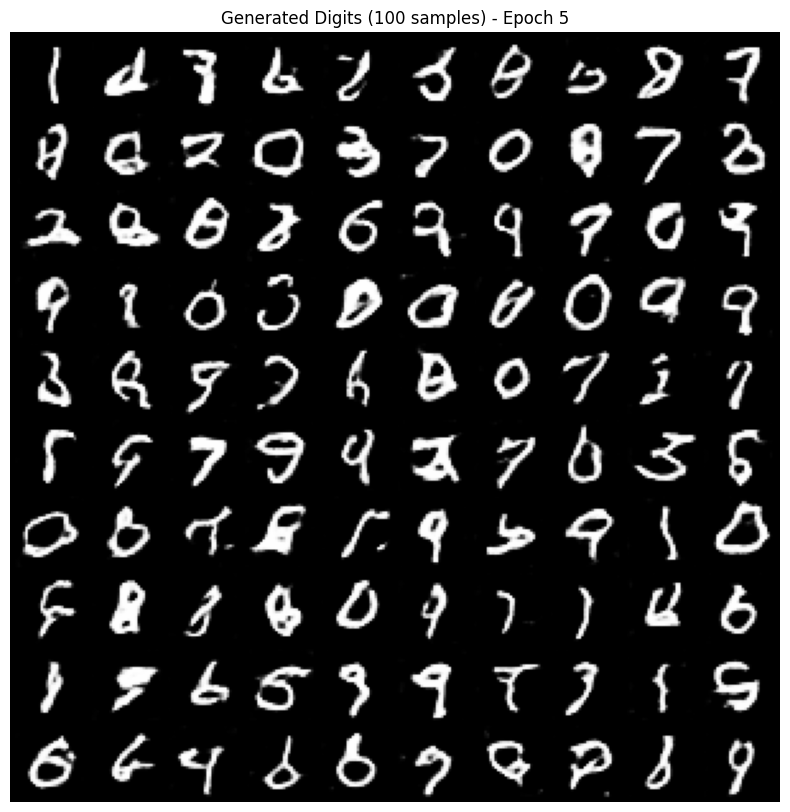

Epoch [6/50] Loss_D(real): 0.4883 Loss_D(fake): 0.4851 Loss_G: 1.3403 Acc Real: 78.02% Acc Fake: 21.30%


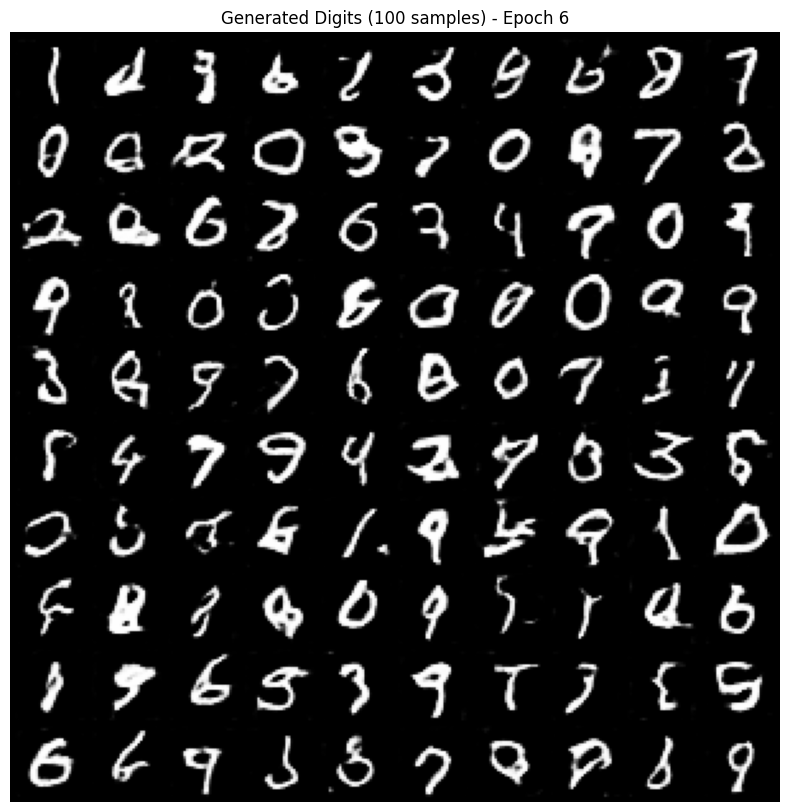

Epoch [7/50] Loss_D(real): 0.5076 Loss_D(fake): 0.5029 Loss_G: 1.3171 Acc Real: 76.50% Acc Fake: 22.95%


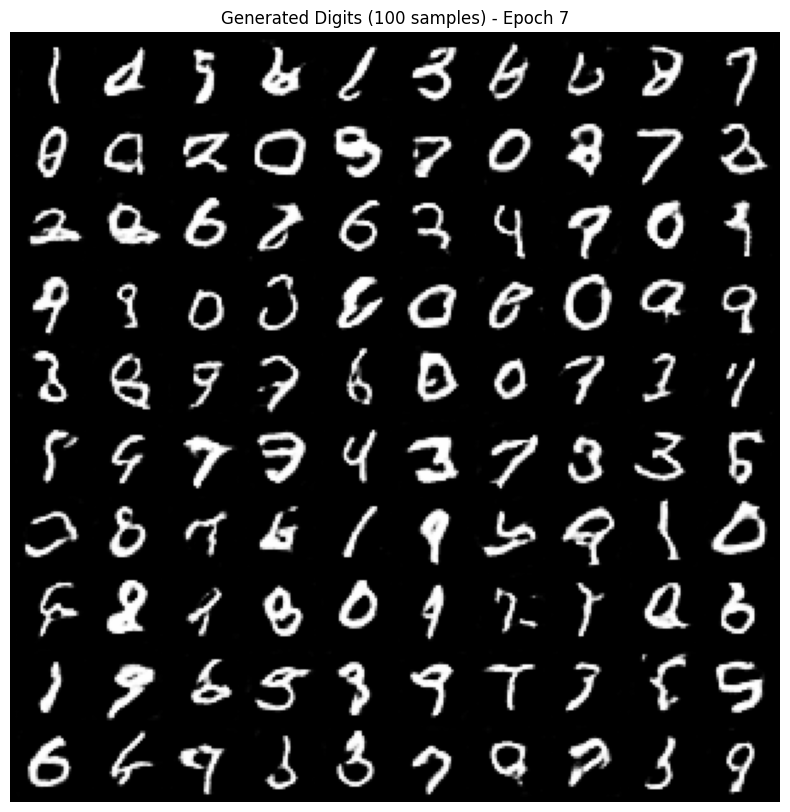

Epoch [8/50] Loss_D(real): 0.5088 Loss_D(fake): 0.5055 Loss_G: 1.3125 Acc Real: 76.01% Acc Fake: 23.24%


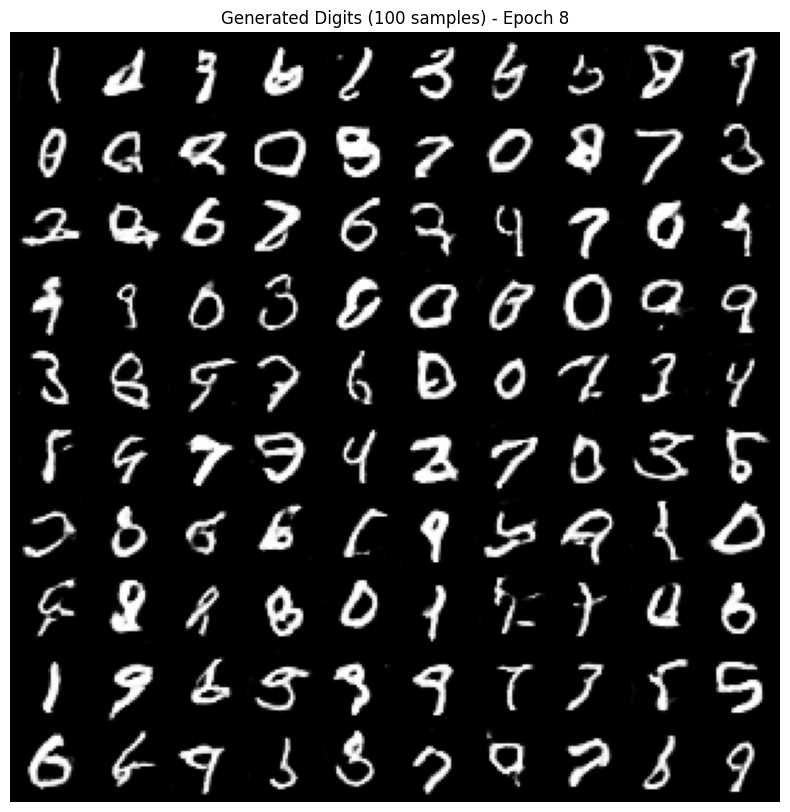

Epoch [9/50] Loss_D(real): 0.5153 Loss_D(fake): 0.5119 Loss_G: 1.3048 Acc Real: 75.49% Acc Fake: 24.12%


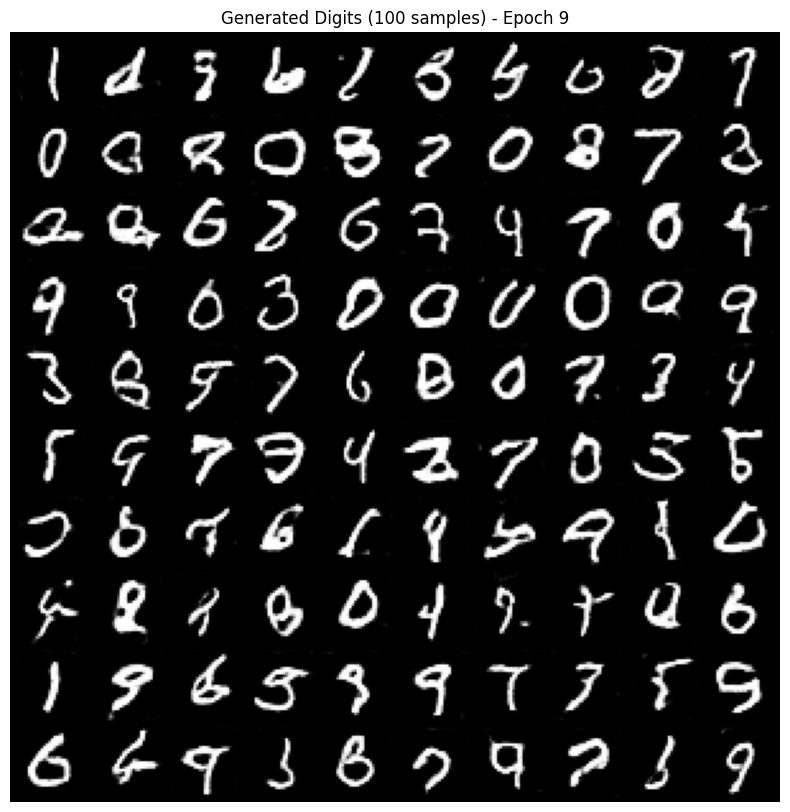

Epoch [10/50] Loss_D(real): 0.5116 Loss_D(fake): 0.5108 Loss_G: 1.2997 Acc Real: 75.72% Acc Fake: 23.59%


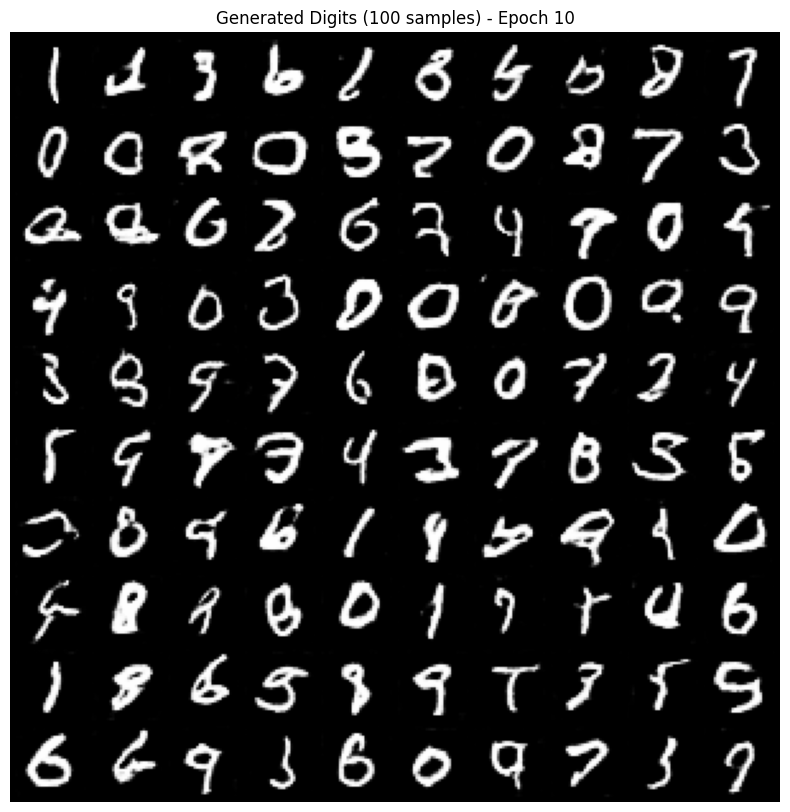

Epoch [11/50] Loss_D(real): 0.5173 Loss_D(fake): 0.5168 Loss_G: 1.3083 Acc Real: 75.12% Acc Fake: 24.77%


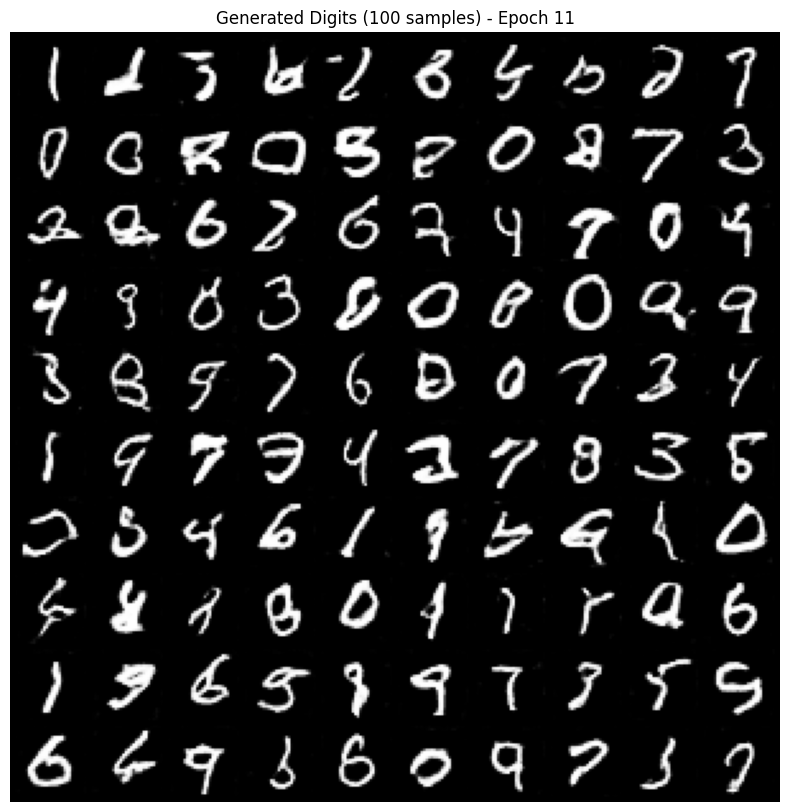

Epoch [12/50] Loss_D(real): 0.5112 Loss_D(fake): 0.5140 Loss_G: 1.3083 Acc Real: 75.52% Acc Fake: 24.43%


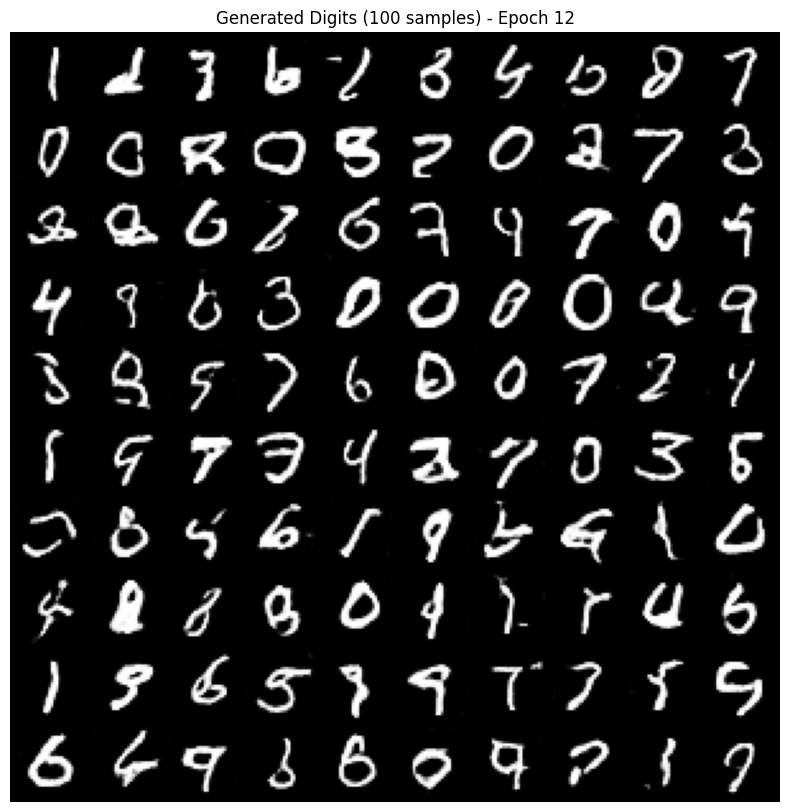

Epoch [13/50] Loss_D(real): 0.5253 Loss_D(fake): 0.5251 Loss_G: 1.2936 Acc Real: 74.68% Acc Fake: 24.91%


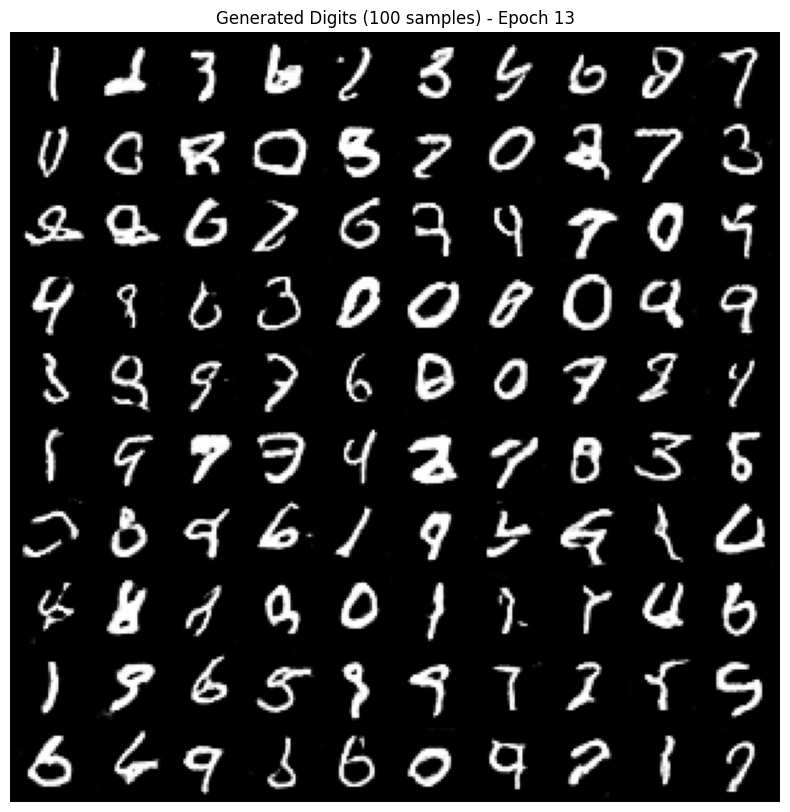

Epoch [14/50] Loss_D(real): 0.5161 Loss_D(fake): 0.5167 Loss_G: 1.3117 Acc Real: 74.96% Acc Fake: 24.81%


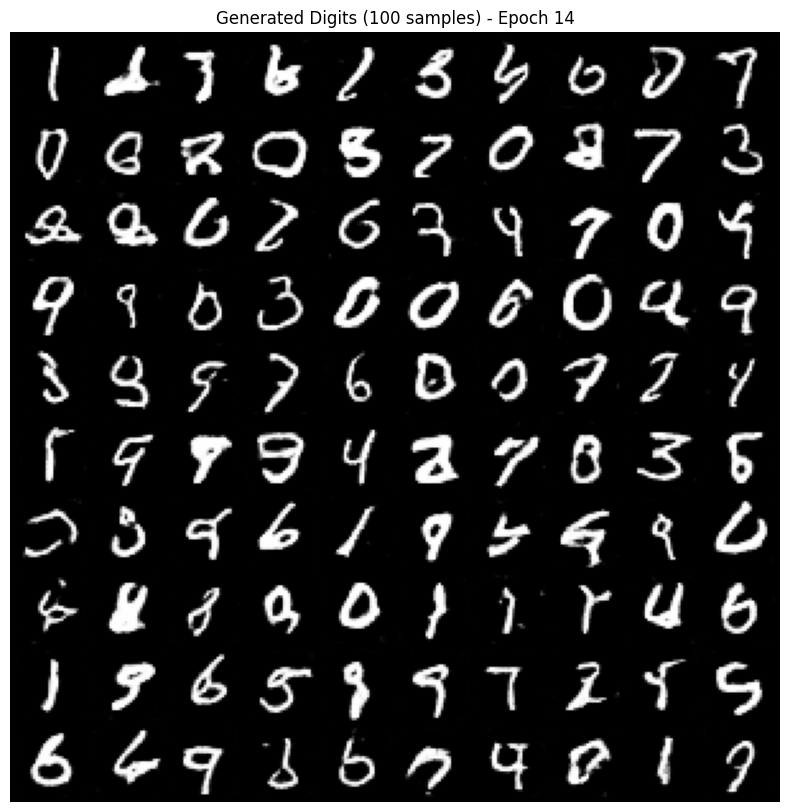

Epoch [15/50] Loss_D(real): 0.5308 Loss_D(fake): 0.5304 Loss_G: 1.2776 Acc Real: 74.53% Acc Fake: 25.34%


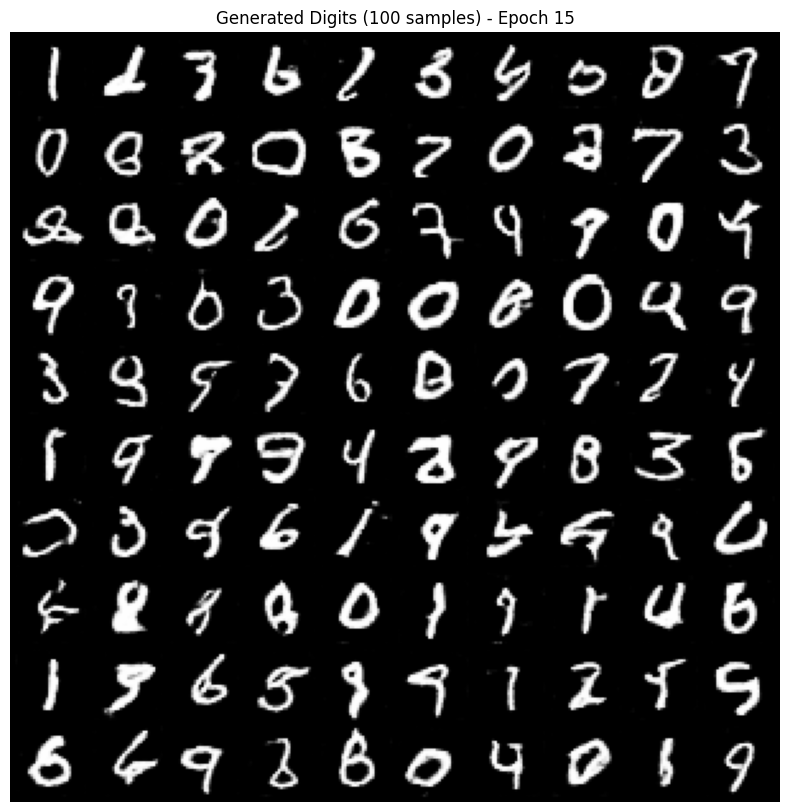

Epoch [16/50] Loss_D(real): 0.5217 Loss_D(fake): 0.5245 Loss_G: 1.2995 Acc Real: 74.64% Acc Fake: 25.34%


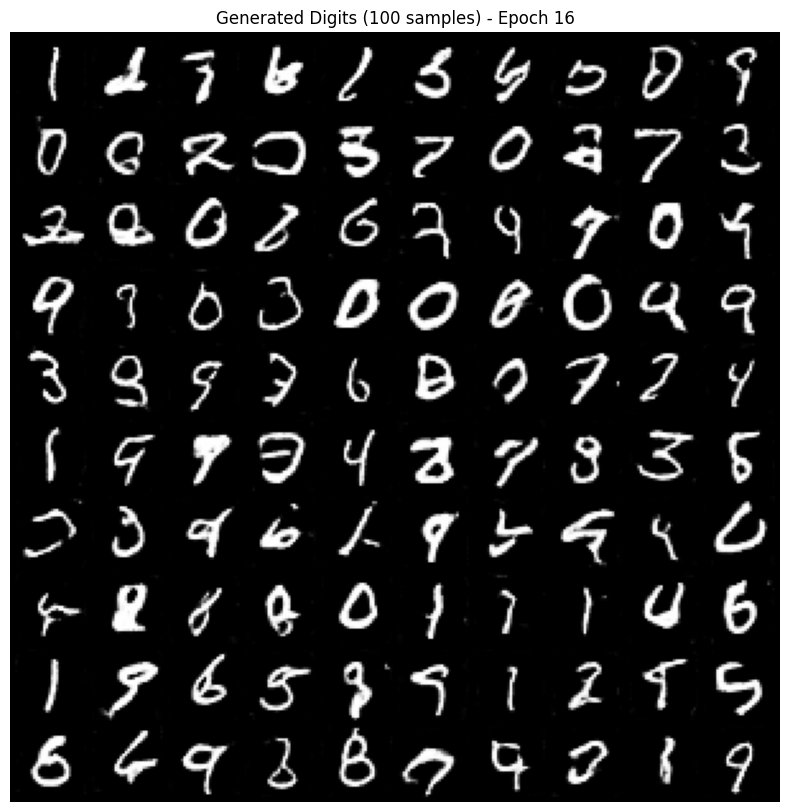

Epoch [17/50] Loss_D(real): 0.5228 Loss_D(fake): 0.5225 Loss_G: 1.2970 Acc Real: 74.58% Acc Fake: 25.15%


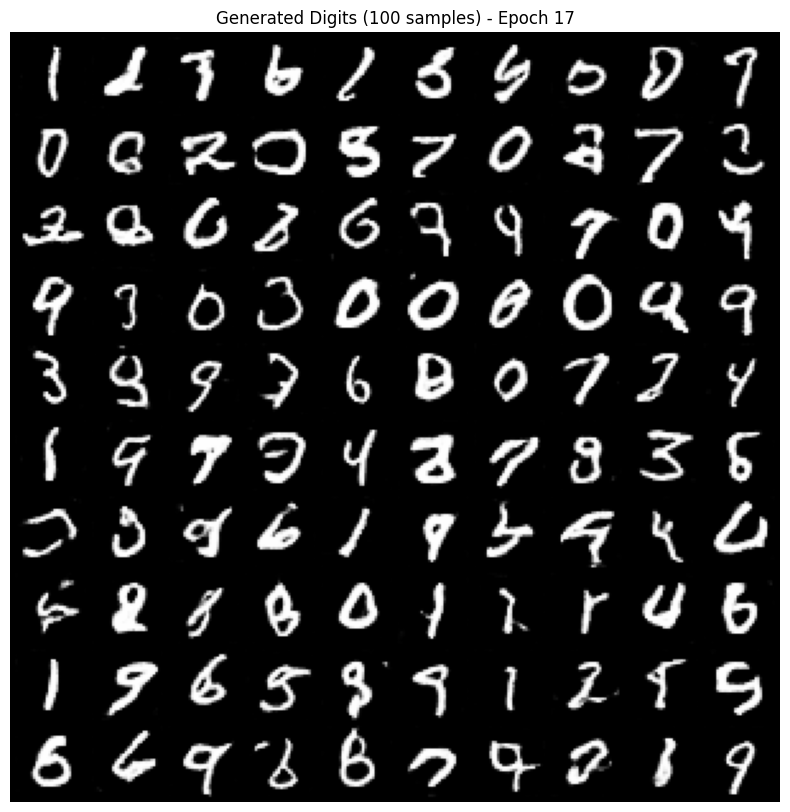

Epoch [18/50] Loss_D(real): 0.5327 Loss_D(fake): 0.5305 Loss_G: 1.2872 Acc Real: 74.17% Acc Fake: 25.66%


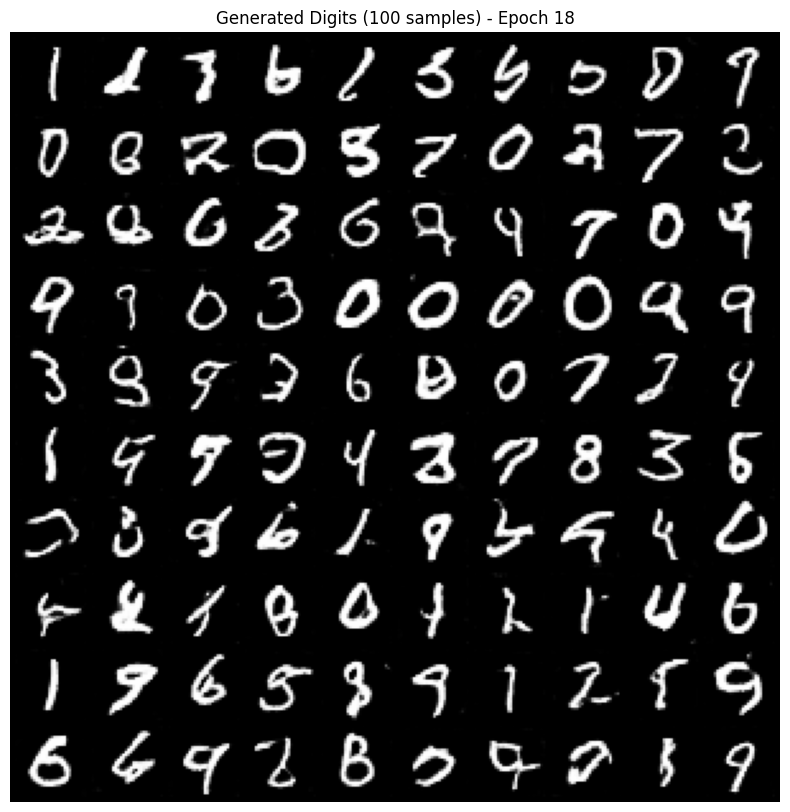

Epoch [19/50] Loss_D(real): 0.5234 Loss_D(fake): 0.5258 Loss_G: 1.2815 Acc Real: 74.46% Acc Fake: 25.52%


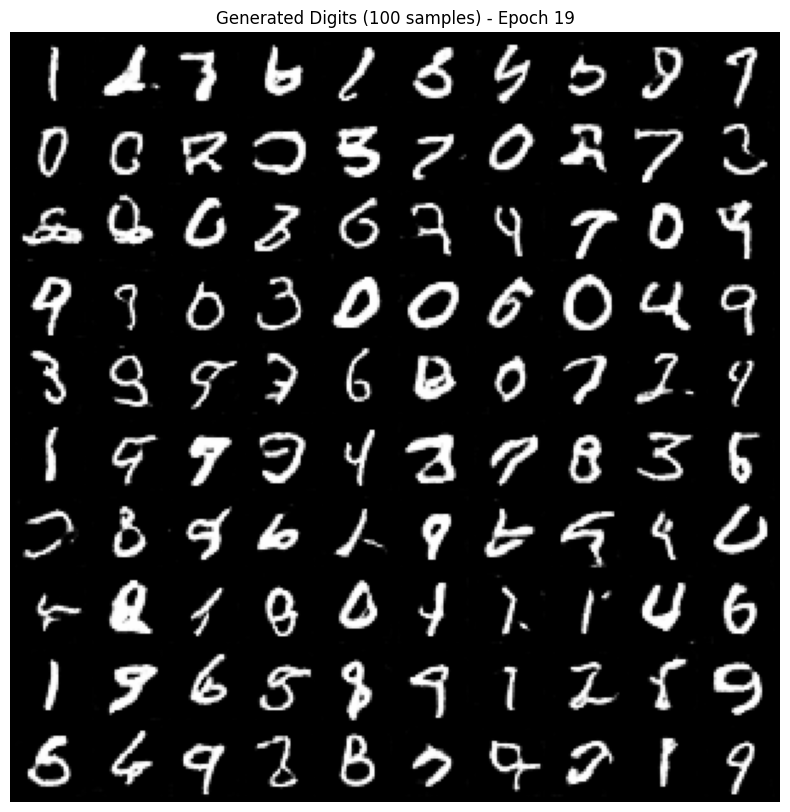

Epoch [20/50] Loss_D(real): 0.5259 Loss_D(fake): 0.5275 Loss_G: 1.2889 Acc Real: 74.25% Acc Fake: 25.82%


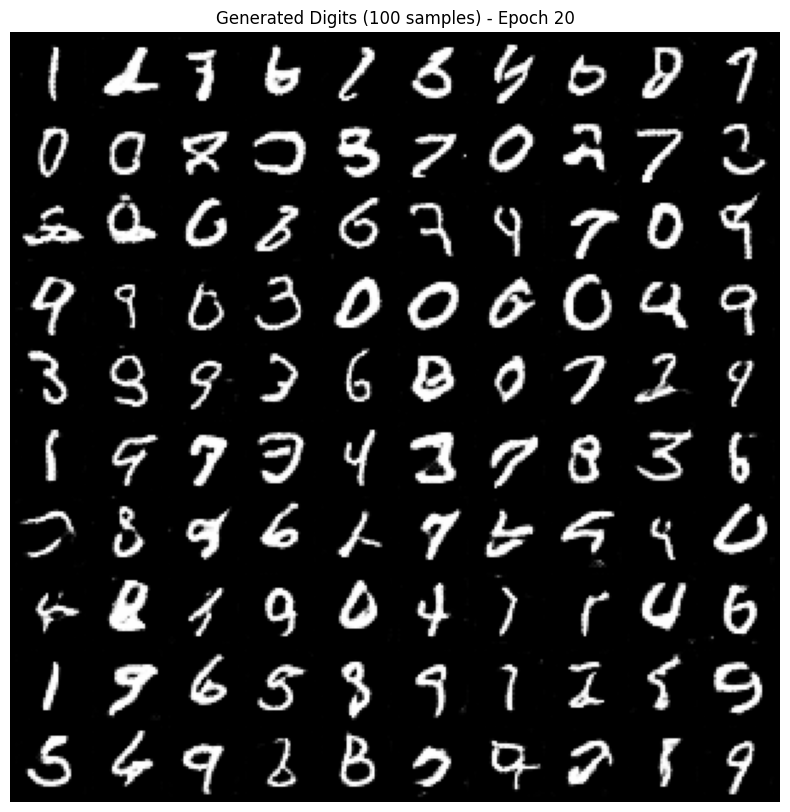

Epoch [21/50] Loss_D(real): 0.5292 Loss_D(fake): 0.5299 Loss_G: 1.2851 Acc Real: 74.02% Acc Fake: 25.98%


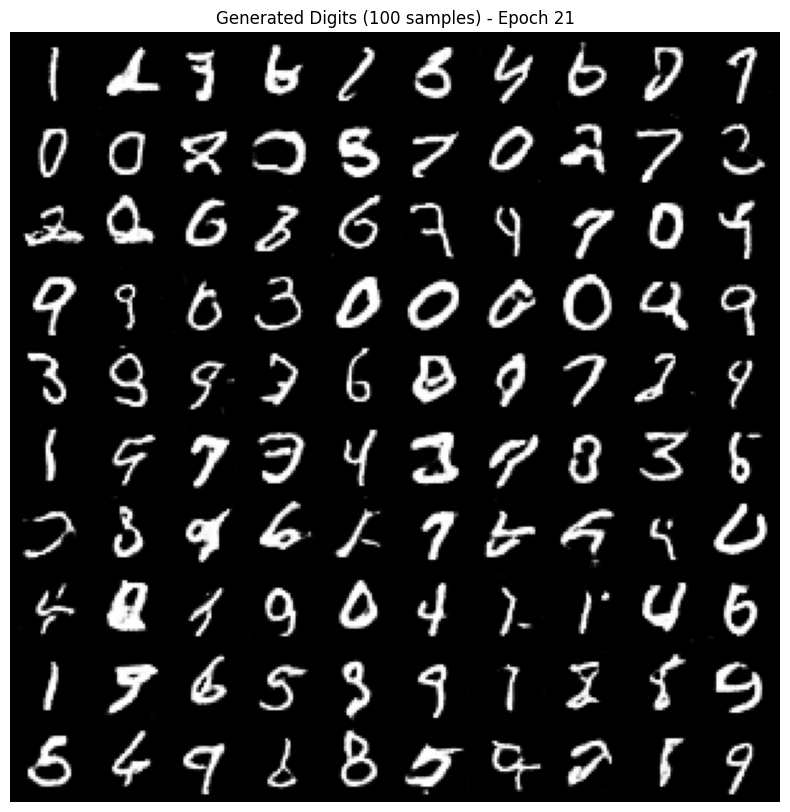

Epoch [22/50] Loss_D(real): 0.5334 Loss_D(fake): 0.5338 Loss_G: 1.2742 Acc Real: 73.62% Acc Fake: 26.33%


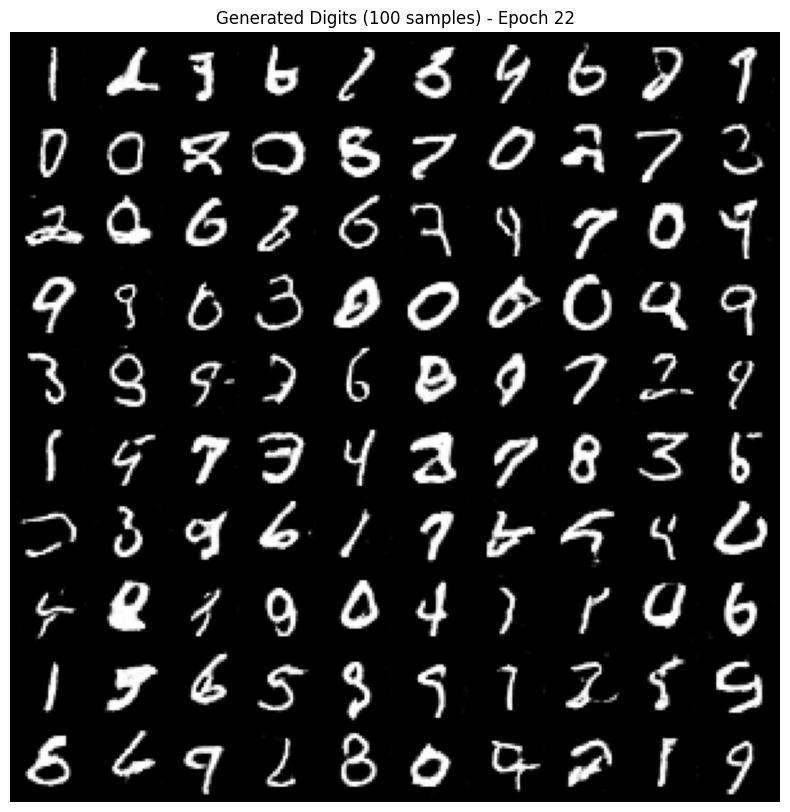

Epoch [23/50] Loss_D(real): 0.5330 Loss_D(fake): 0.5329 Loss_G: 1.2769 Acc Real: 73.60% Acc Fake: 26.18%


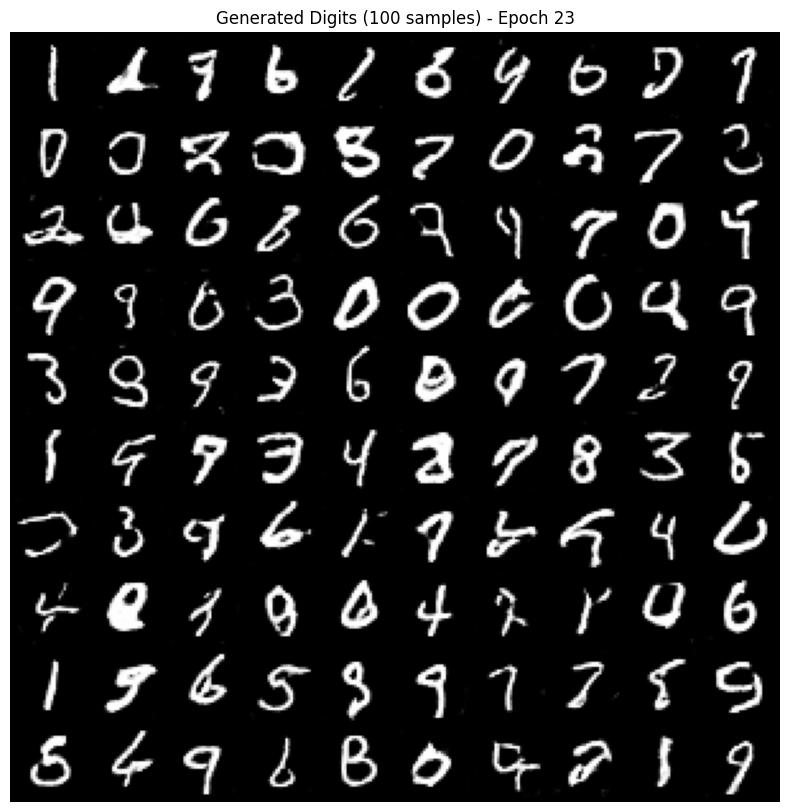

Epoch [24/50] Loss_D(real): 0.5356 Loss_D(fake): 0.5380 Loss_G: 1.2728 Acc Real: 73.56% Acc Fake: 26.78%


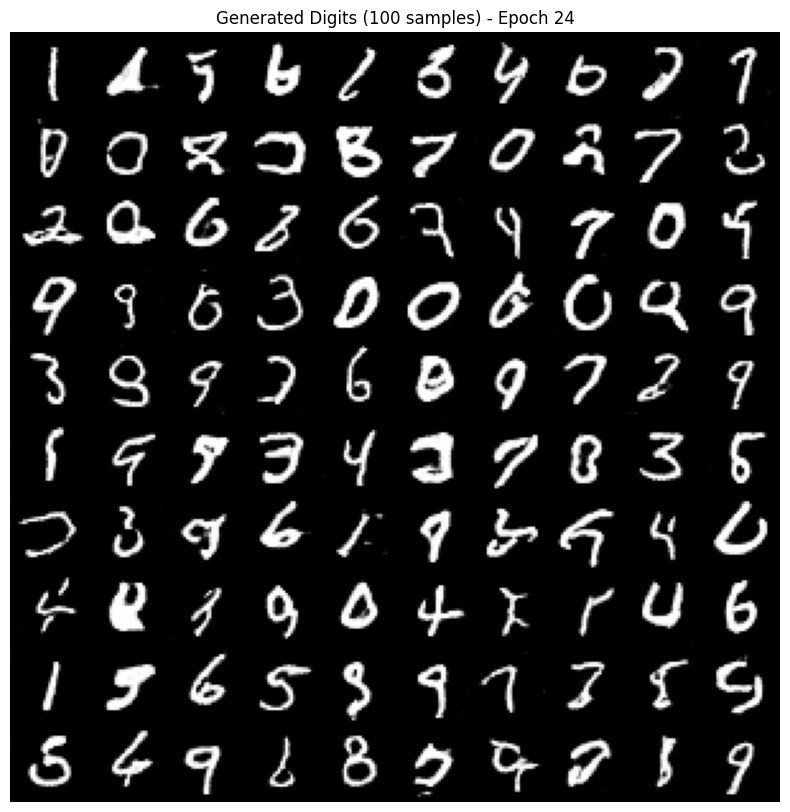

Epoch [25/50] Loss_D(real): 0.5426 Loss_D(fake): 0.5431 Loss_G: 1.2540 Acc Real: 73.50% Acc Fake: 26.86%


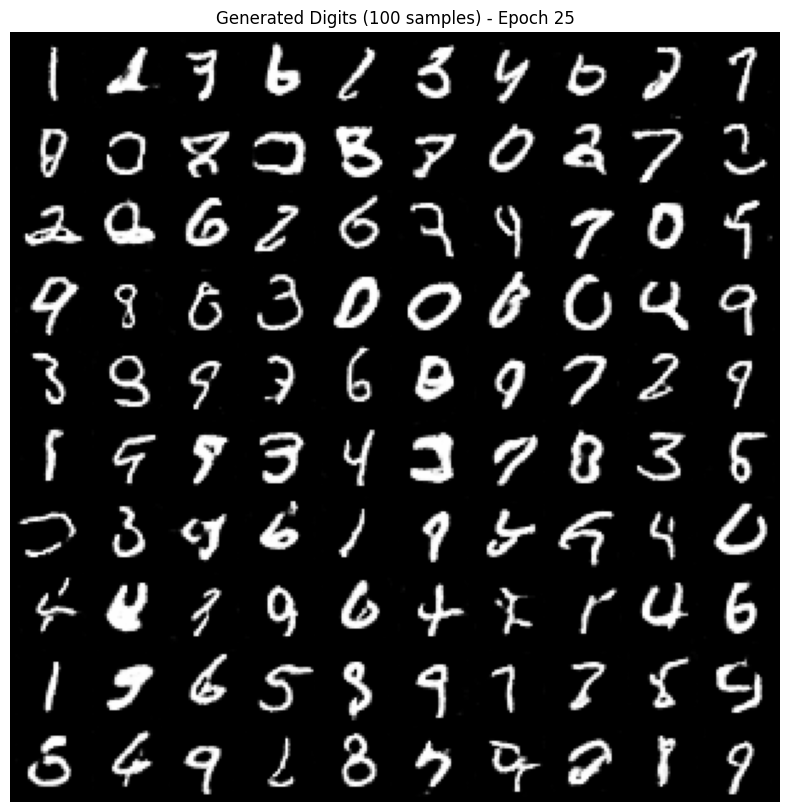

Epoch [26/50] Loss_D(real): 0.5491 Loss_D(fake): 0.5464 Loss_G: 1.2597 Acc Real: 72.67% Acc Fake: 27.48%


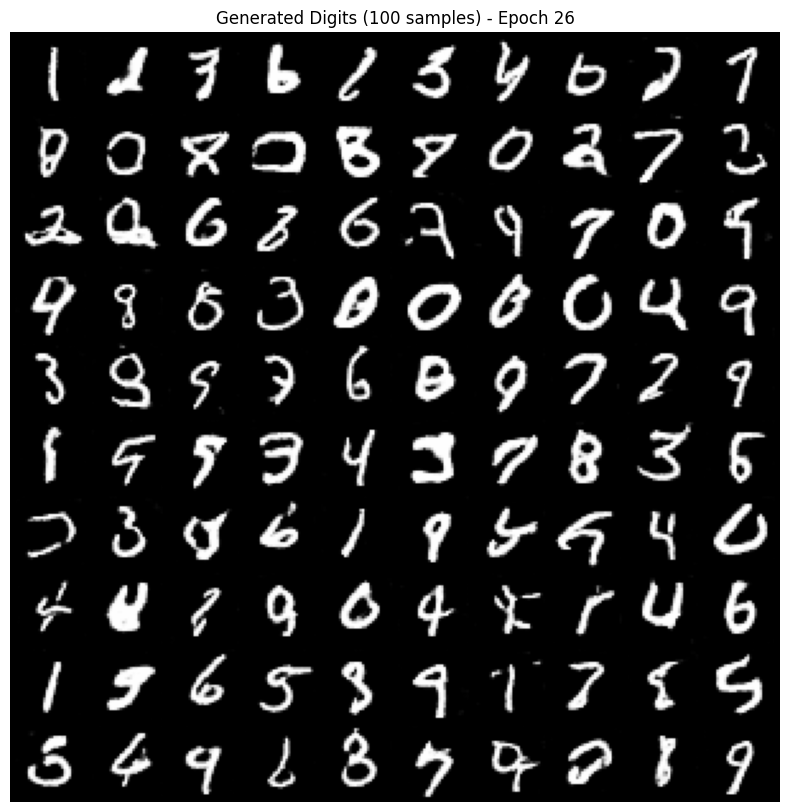

Epoch [27/50] Loss_D(real): 0.5408 Loss_D(fake): 0.5417 Loss_G: 1.2551 Acc Real: 73.06% Acc Fake: 27.05%


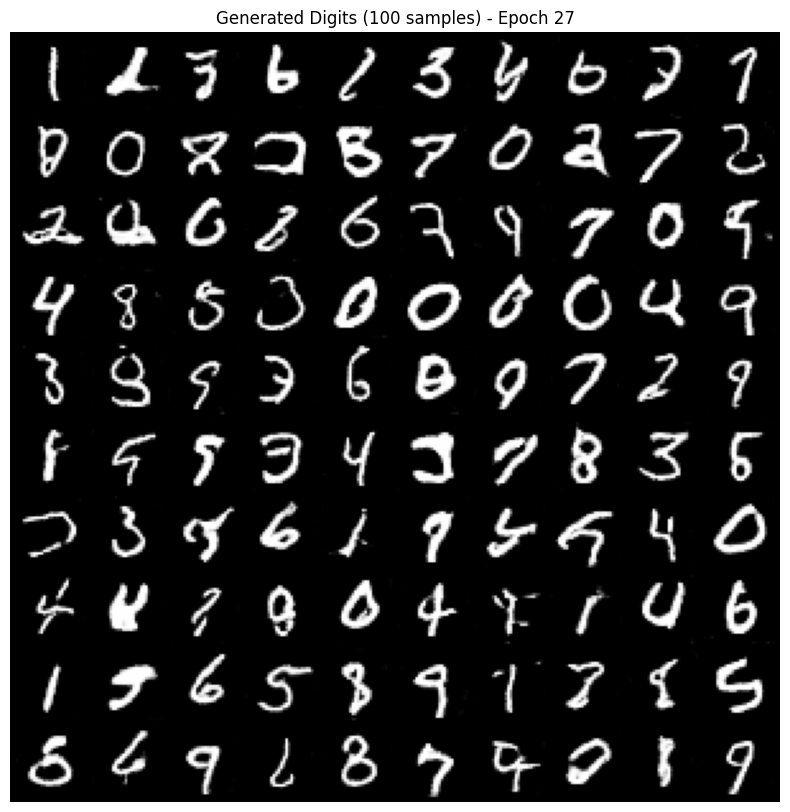

Epoch [28/50] Loss_D(real): 0.5412 Loss_D(fake): 0.5425 Loss_G: 1.2537 Acc Real: 73.25% Acc Fake: 26.90%


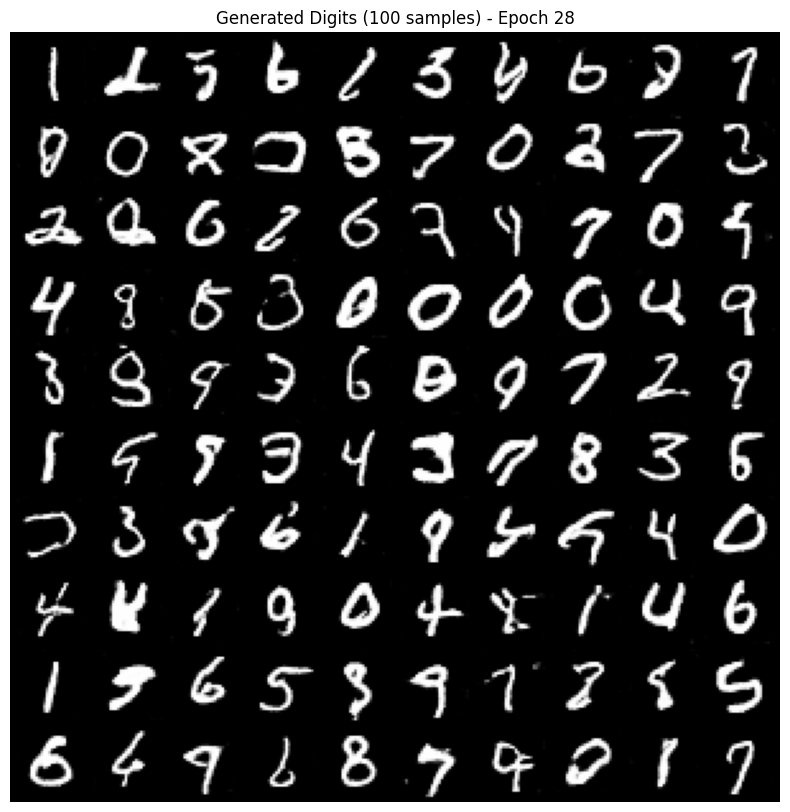

Epoch [29/50] Loss_D(real): 0.5390 Loss_D(fake): 0.5415 Loss_G: 1.2662 Acc Real: 73.33% Acc Fake: 26.87%


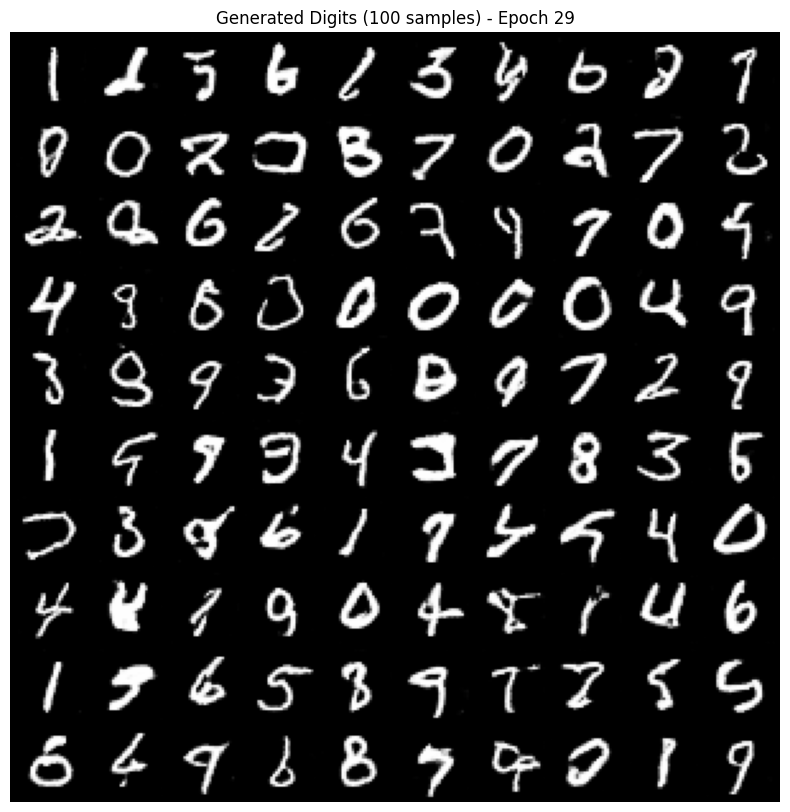

Epoch [30/50] Loss_D(real): 0.5404 Loss_D(fake): 0.5409 Loss_G: 1.2665 Acc Real: 72.97% Acc Fake: 27.21%


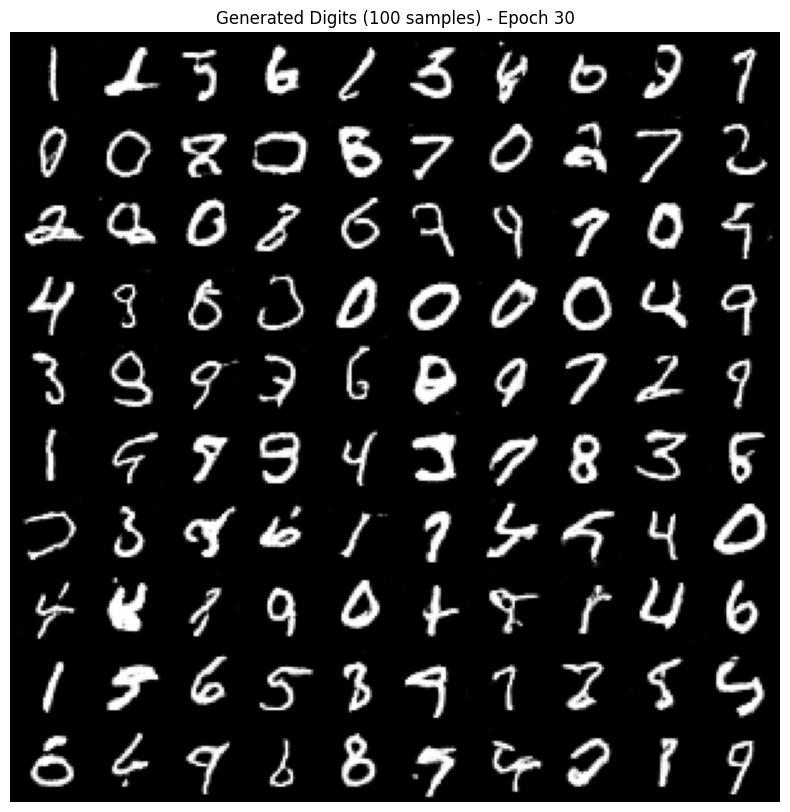

Epoch [31/50] Loss_D(real): 0.5374 Loss_D(fake): 0.5377 Loss_G: 1.2631 Acc Real: 73.27% Acc Fake: 26.96%


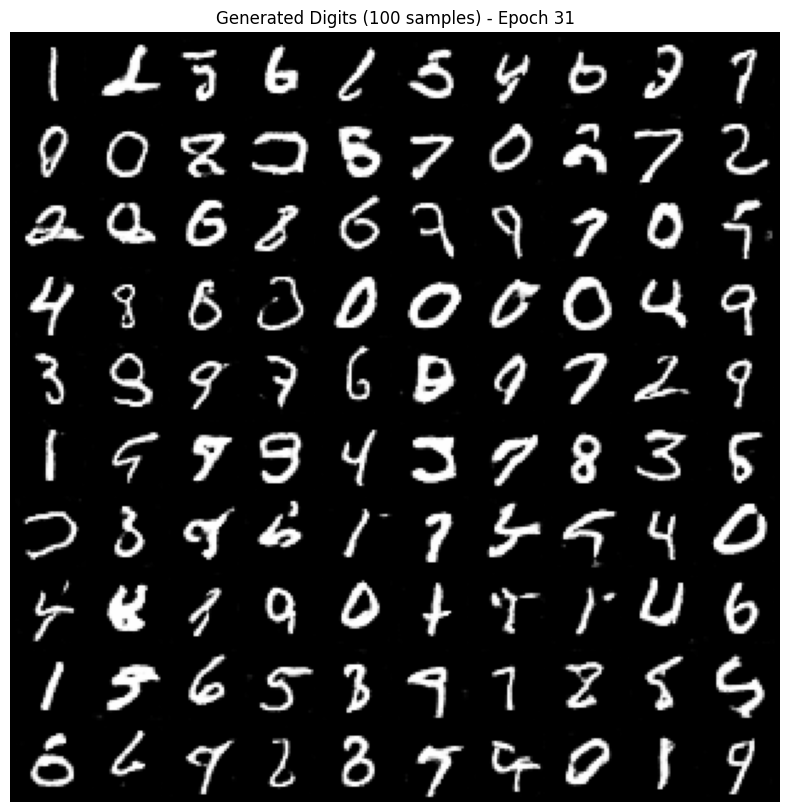

Epoch [32/50] Loss_D(real): 0.5391 Loss_D(fake): 0.5417 Loss_G: 1.2716 Acc Real: 73.20% Acc Fake: 27.23%


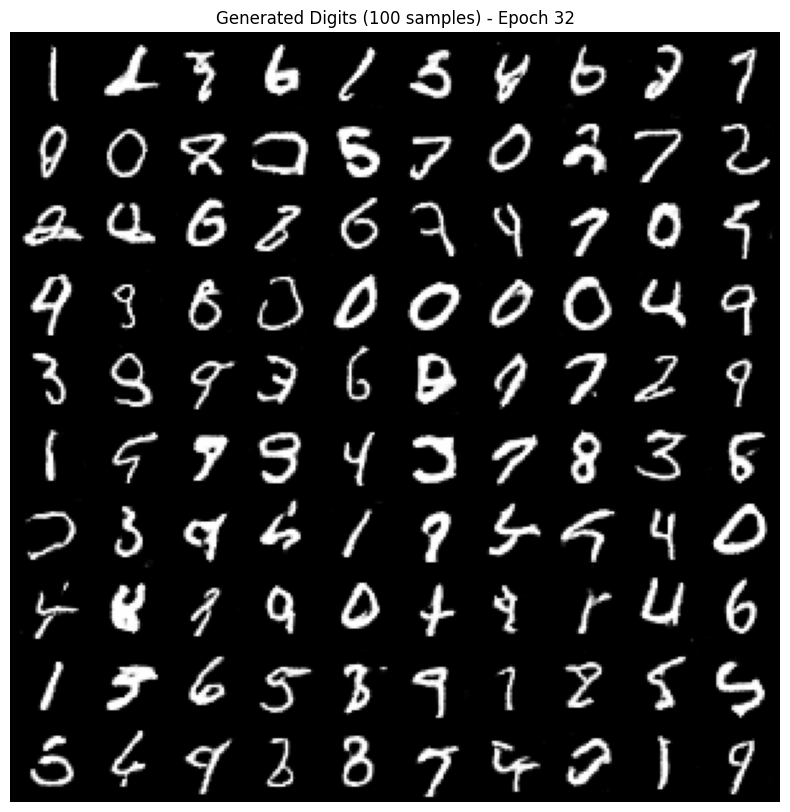

Epoch [33/50] Loss_D(real): 0.5422 Loss_D(fake): 0.5450 Loss_G: 1.2636 Acc Real: 73.18% Acc Fake: 27.30%


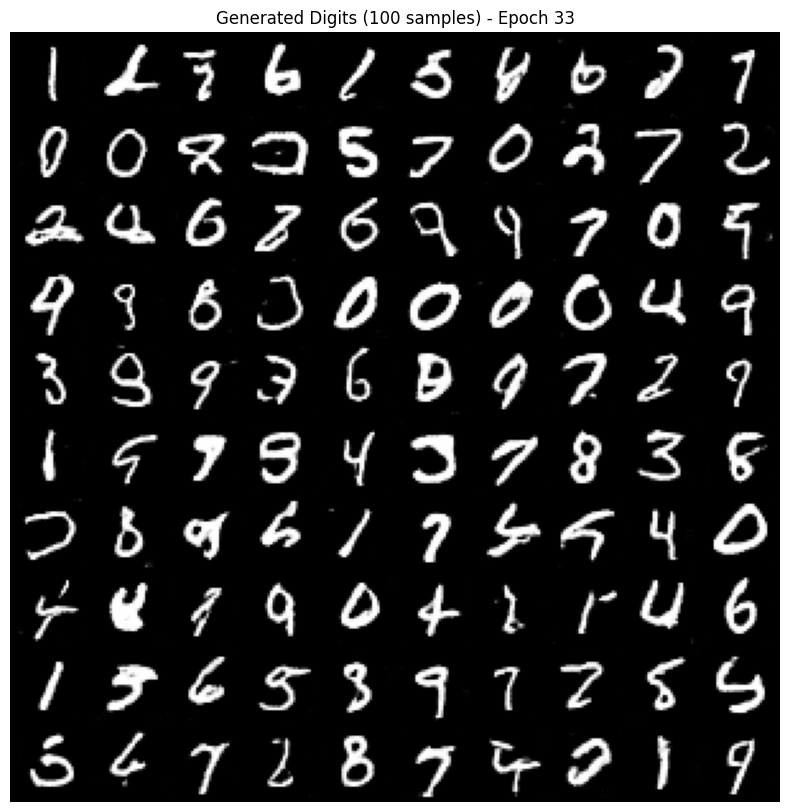

Epoch [34/50] Loss_D(real): 0.5384 Loss_D(fake): 0.5389 Loss_G: 1.2603 Acc Real: 73.44% Acc Fake: 26.87%


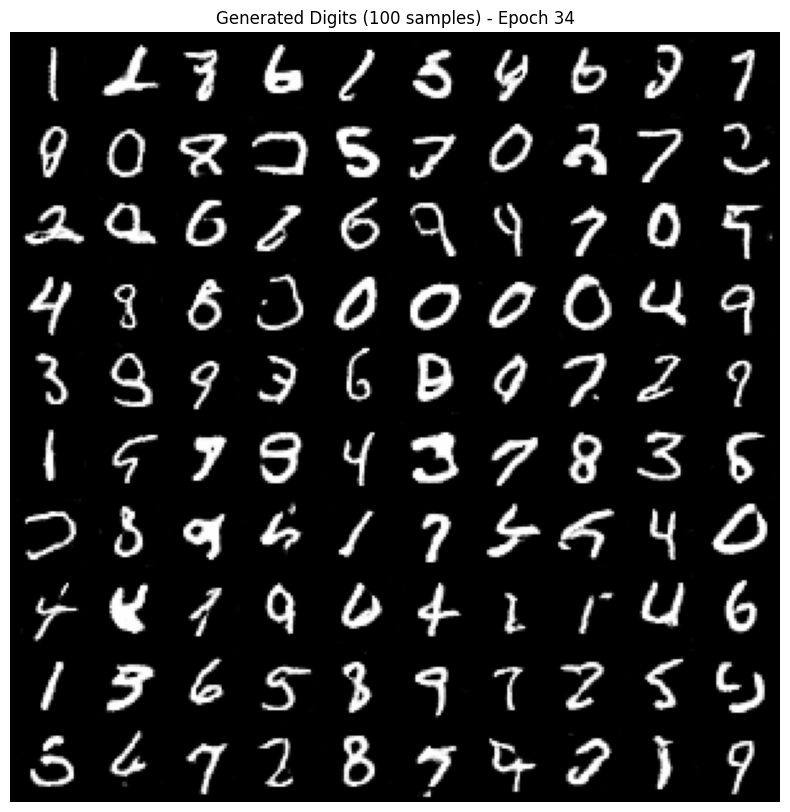

Epoch [35/50] Loss_D(real): 0.5453 Loss_D(fake): 0.5475 Loss_G: 1.2647 Acc Real: 72.64% Acc Fake: 27.64%


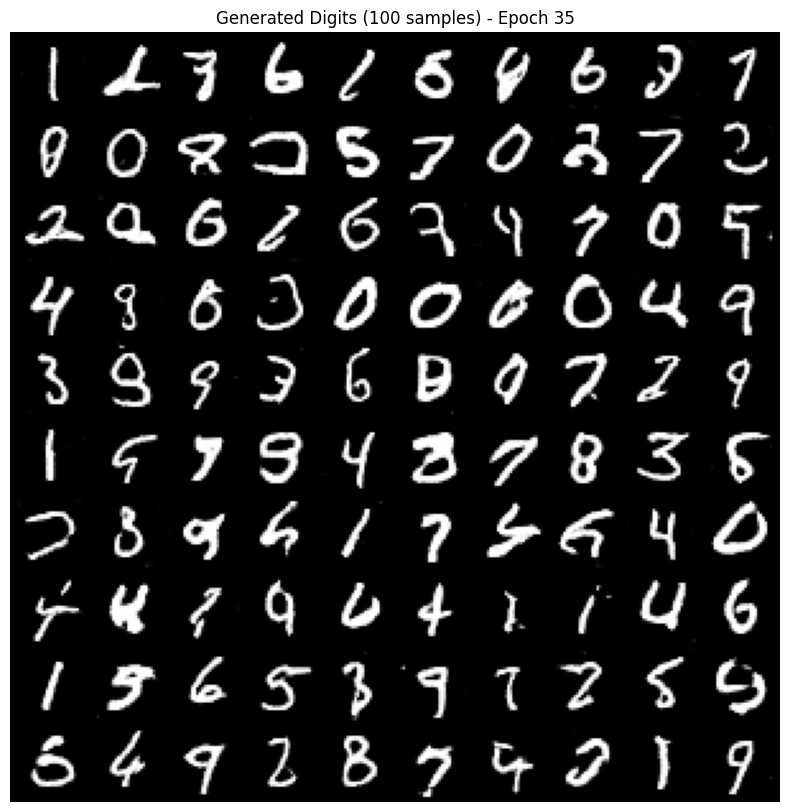

Epoch [36/50] Loss_D(real): 0.5417 Loss_D(fake): 0.5425 Loss_G: 1.2603 Acc Real: 73.00% Acc Fake: 27.15%


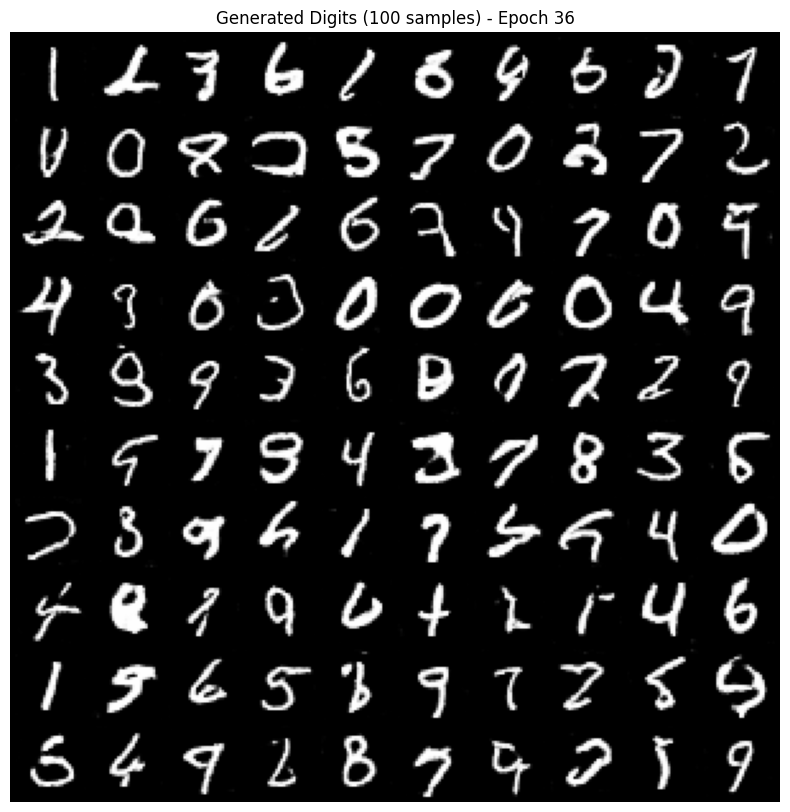

Epoch [37/50] Loss_D(real): 0.5406 Loss_D(fake): 0.5431 Loss_G: 1.2677 Acc Real: 73.00% Acc Fake: 27.21%


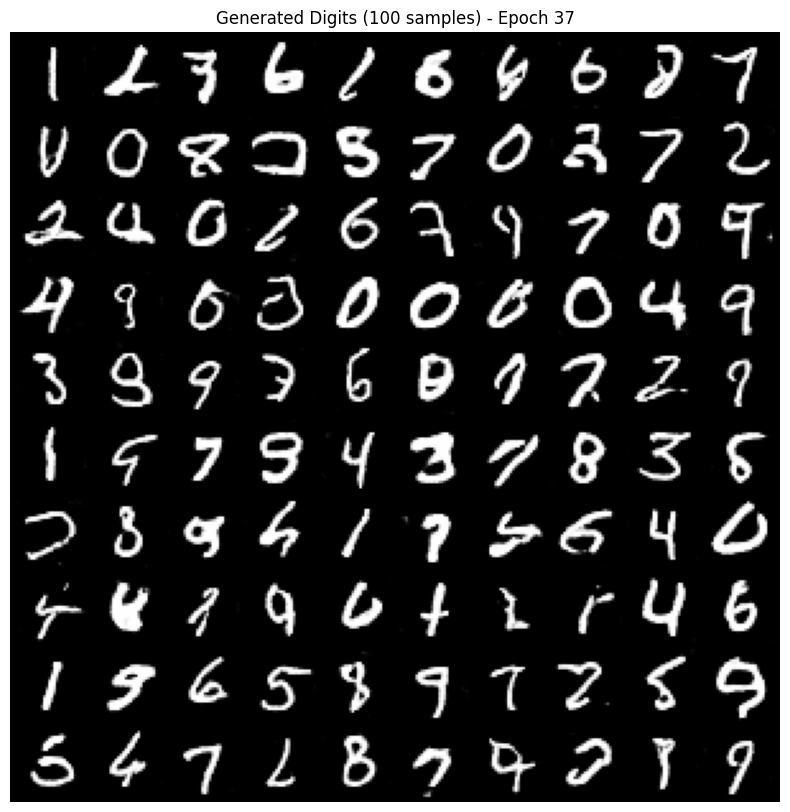

Epoch [38/50] Loss_D(real): 0.5446 Loss_D(fake): 0.5485 Loss_G: 1.2742 Acc Real: 72.89% Acc Fake: 27.45%


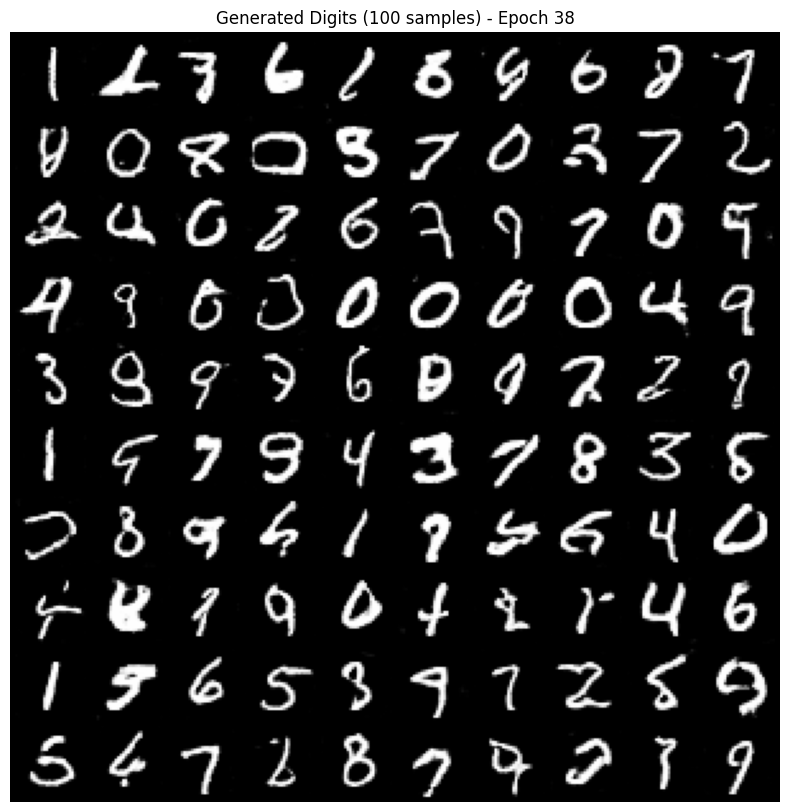

Epoch [39/50] Loss_D(real): 0.5413 Loss_D(fake): 0.5417 Loss_G: 1.2639 Acc Real: 73.07% Acc Fake: 27.02%


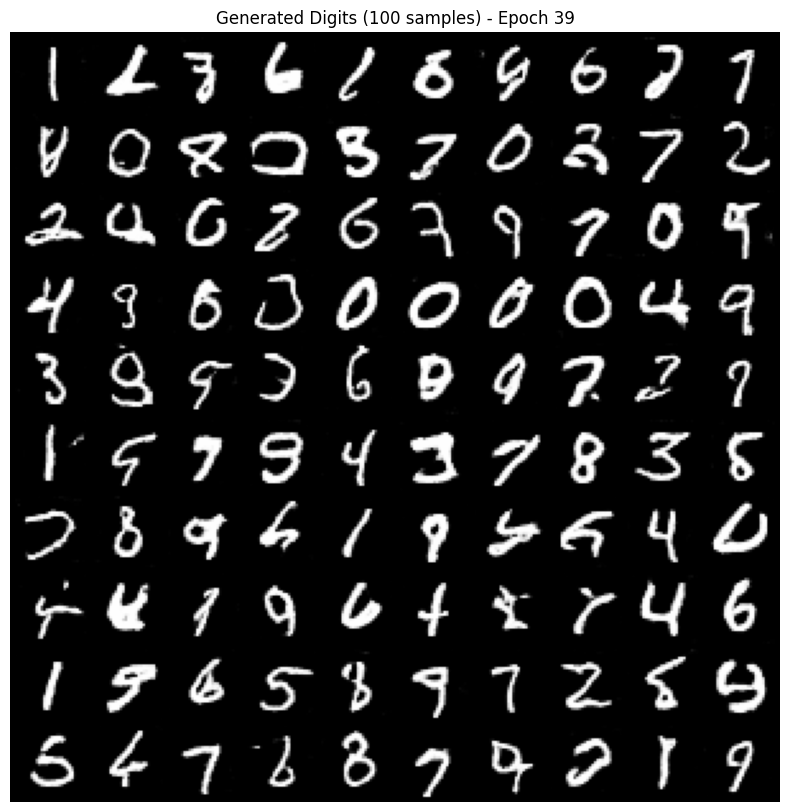

Epoch [40/50] Loss_D(real): 0.5394 Loss_D(fake): 0.5421 Loss_G: 1.2800 Acc Real: 73.40% Acc Fake: 27.08%


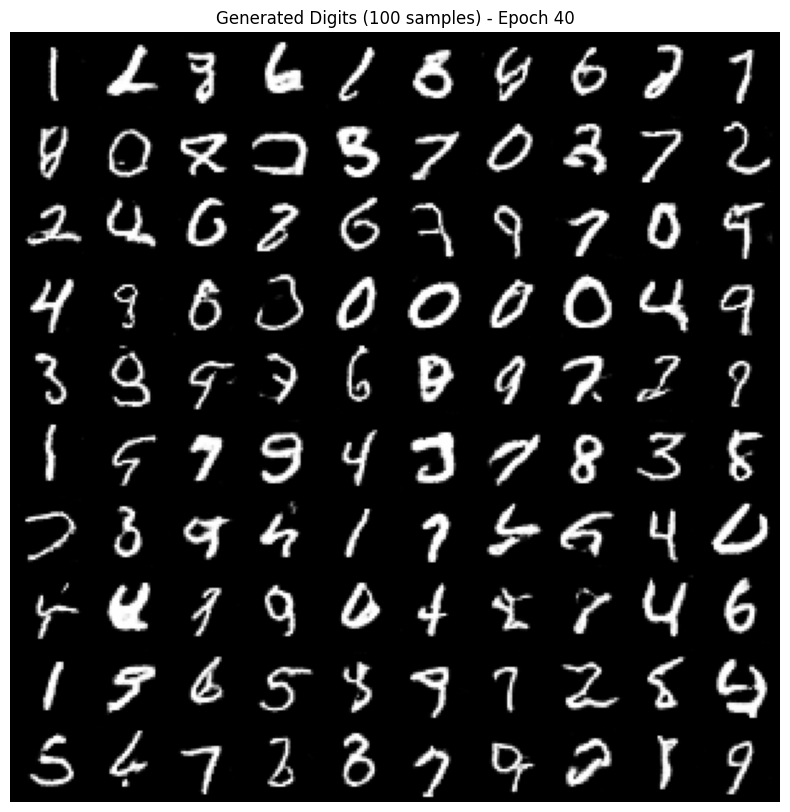

Epoch [41/50] Loss_D(real): 0.5329 Loss_D(fake): 0.5365 Loss_G: 1.2757 Acc Real: 73.73% Acc Fake: 26.66%


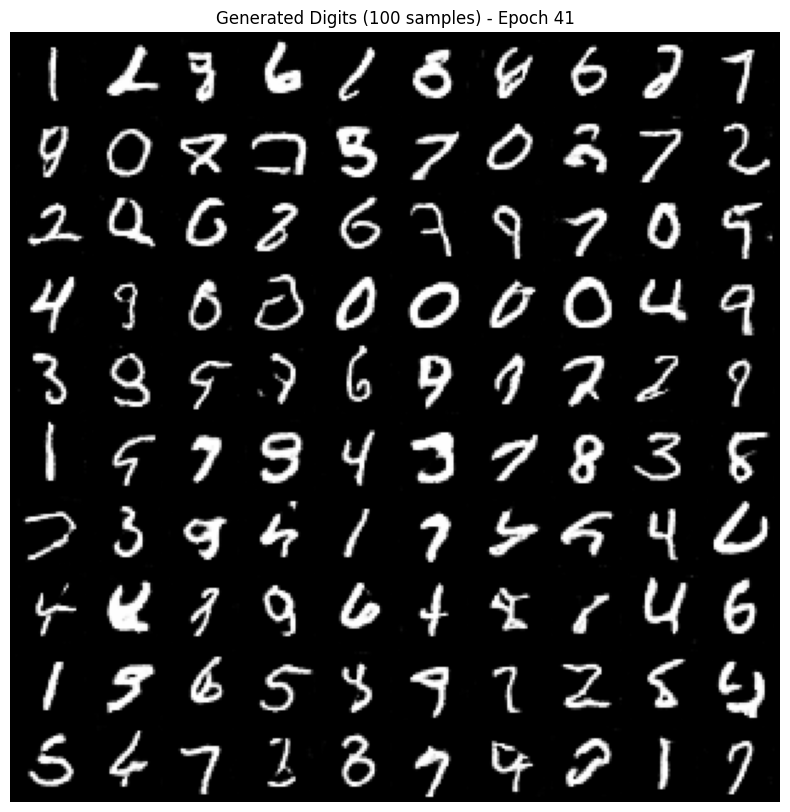

Epoch [42/50] Loss_D(real): 0.5349 Loss_D(fake): 0.5373 Loss_G: 1.2894 Acc Real: 73.42% Acc Fake: 27.20%


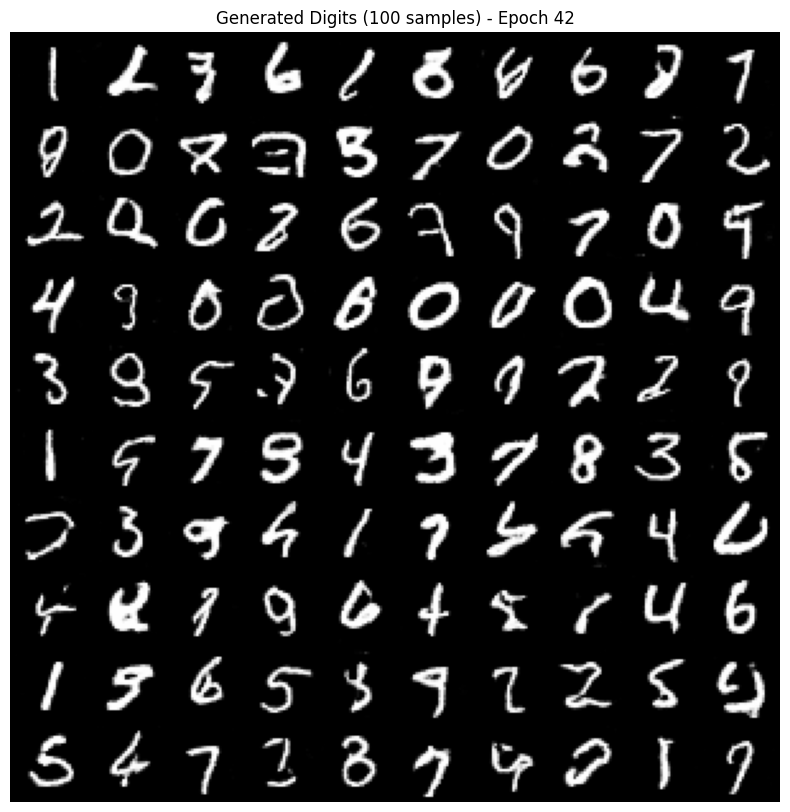

Epoch [43/50] Loss_D(real): 0.5415 Loss_D(fake): 0.5434 Loss_G: 1.2986 Acc Real: 73.01% Acc Fake: 27.31%


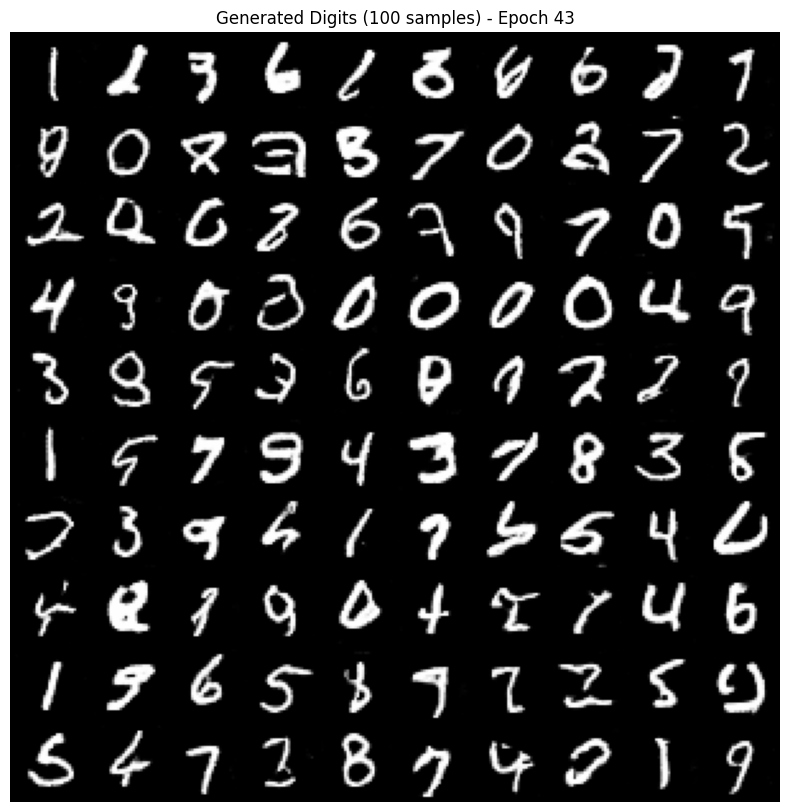

Epoch [44/50] Loss_D(real): 0.5349 Loss_D(fake): 0.5377 Loss_G: 1.2781 Acc Real: 73.51% Acc Fake: 27.06%


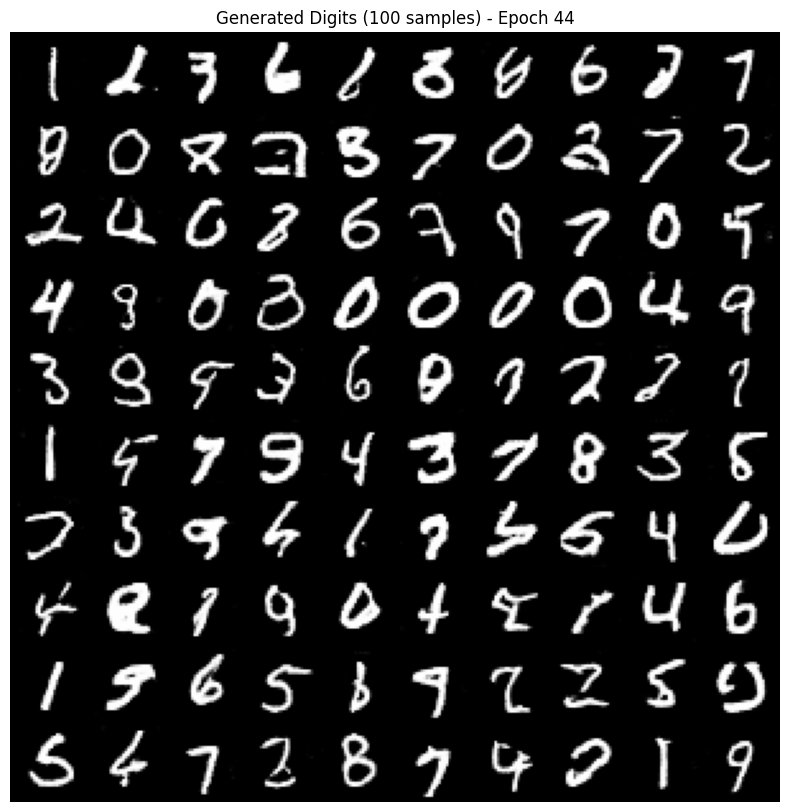

Epoch [45/50] Loss_D(real): 0.5331 Loss_D(fake): 0.5347 Loss_G: 1.3017 Acc Real: 73.63% Acc Fake: 26.74%


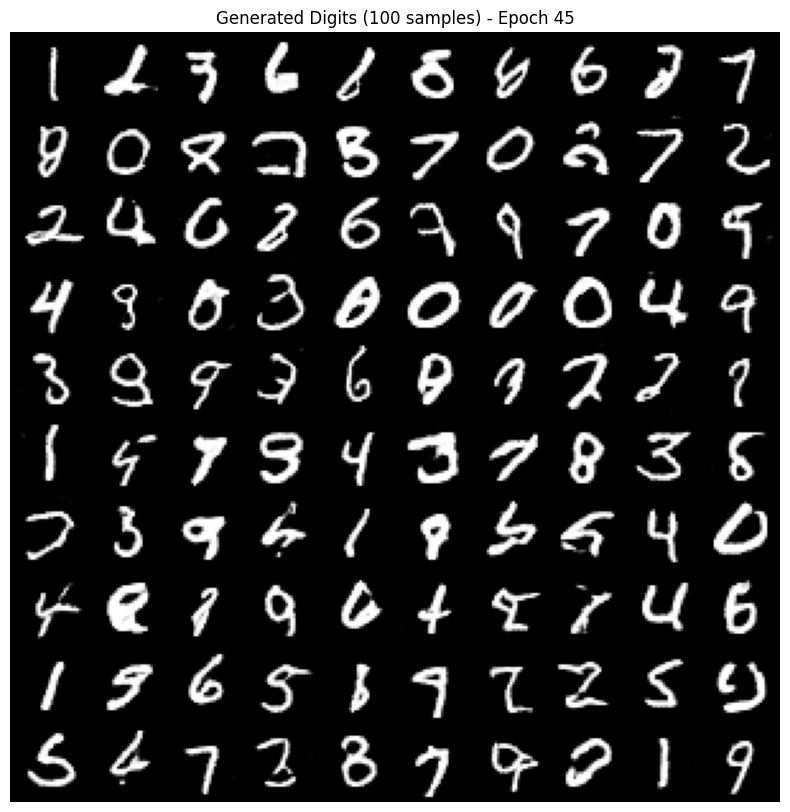

Epoch [46/50] Loss_D(real): 0.5364 Loss_D(fake): 0.5390 Loss_G: 1.2896 Acc Real: 73.33% Acc Fake: 27.02%


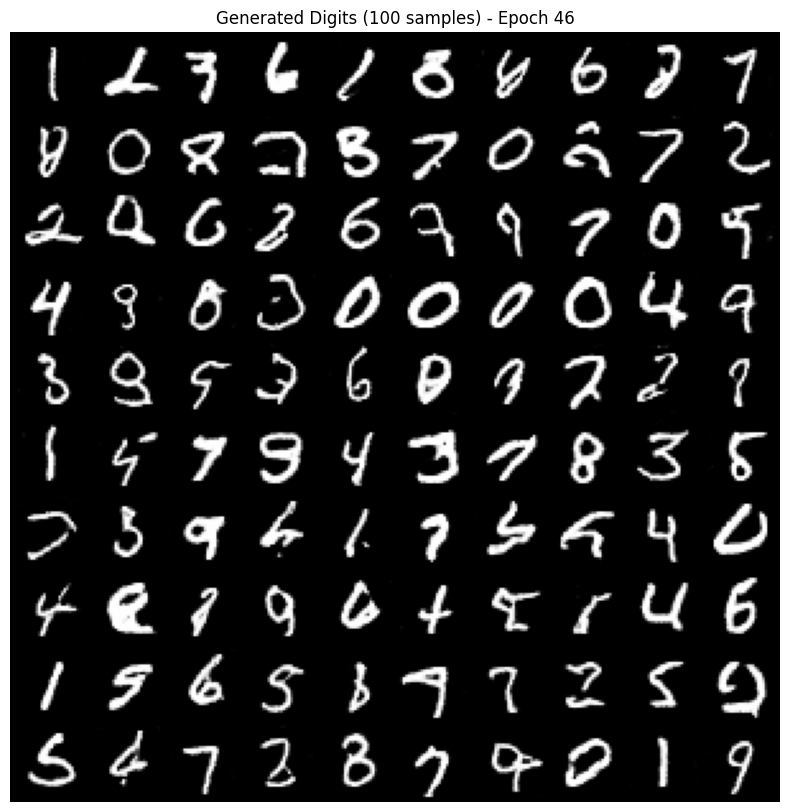

Epoch [47/50] Loss_D(real): 0.5397 Loss_D(fake): 0.5445 Loss_G: 1.2933 Acc Real: 73.32% Acc Fake: 26.89%


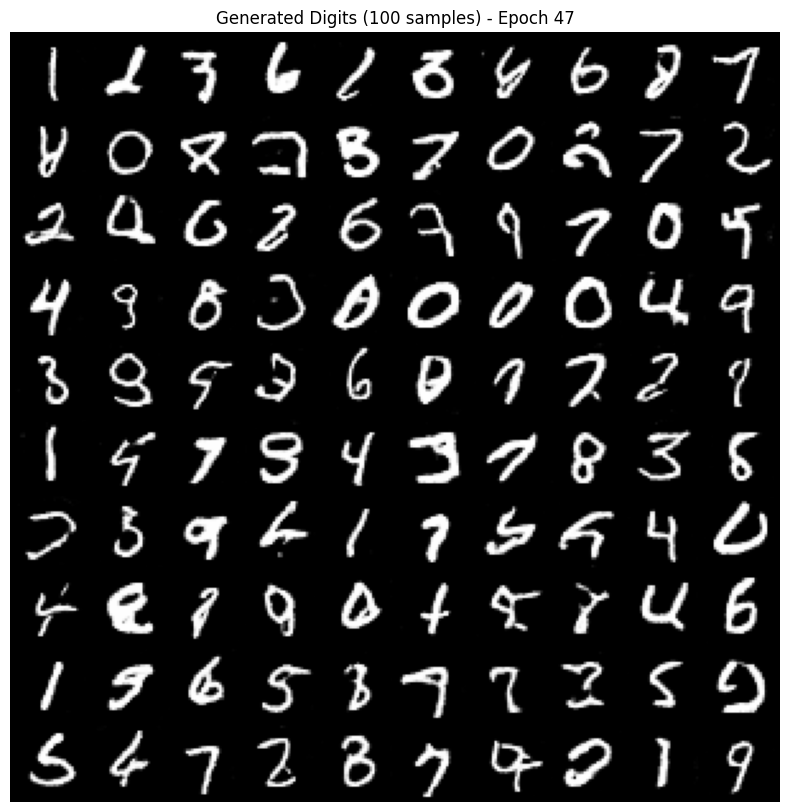

Epoch [48/50] Loss_D(real): 0.5358 Loss_D(fake): 0.5384 Loss_G: 1.2949 Acc Real: 73.68% Acc Fake: 26.76%


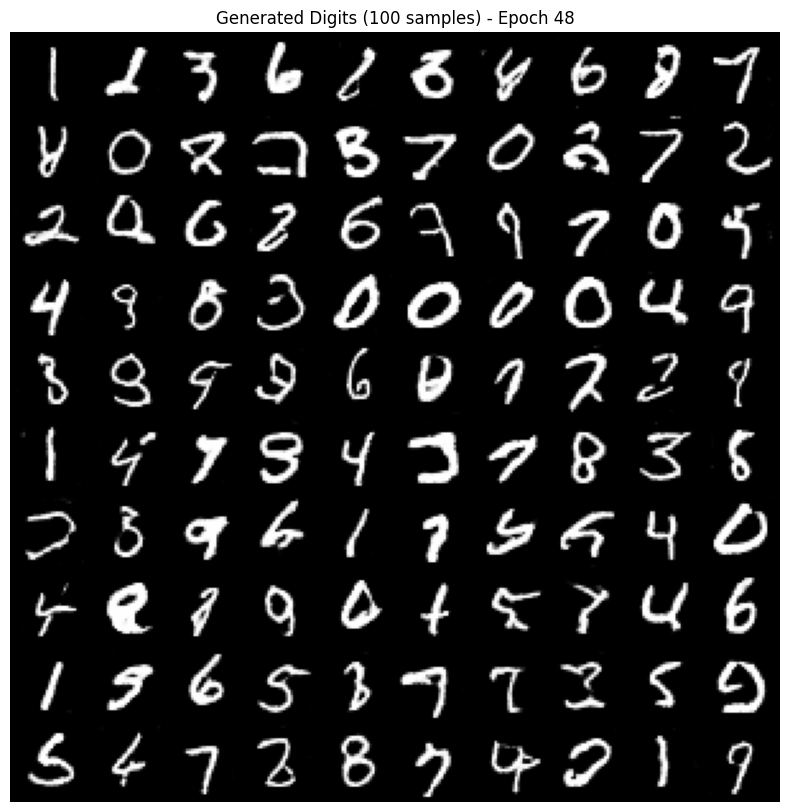

Epoch [49/50] Loss_D(real): 0.5296 Loss_D(fake): 0.5319 Loss_G: 1.2992 Acc Real: 74.15% Acc Fake: 26.32%


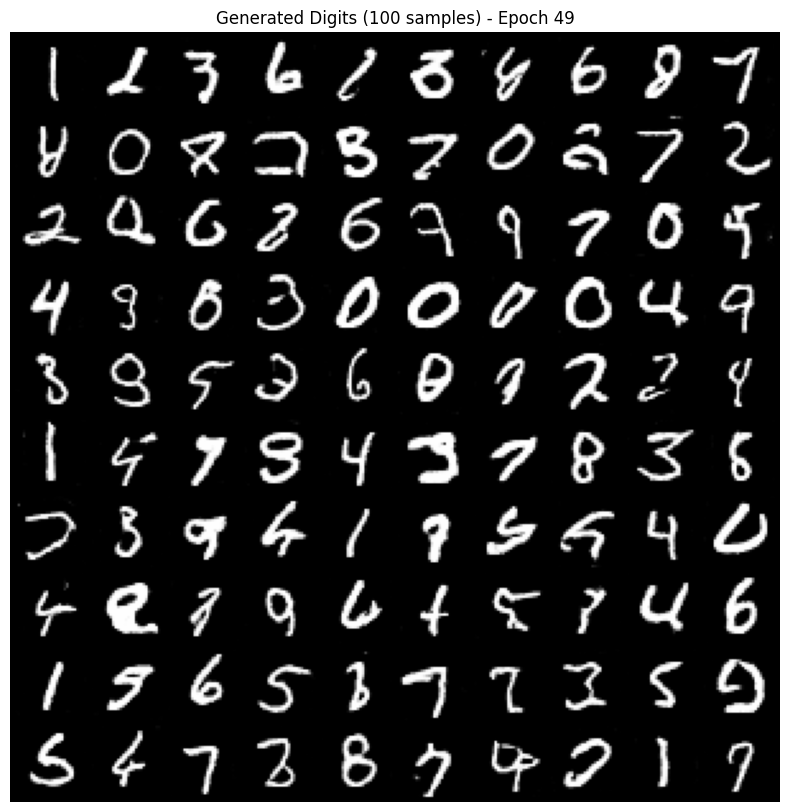

Epoch [50/50] Loss_D(real): 0.5306 Loss_D(fake): 0.5340 Loss_G: 1.3095 Acc Real: 73.82% Acc Fake: 26.44%


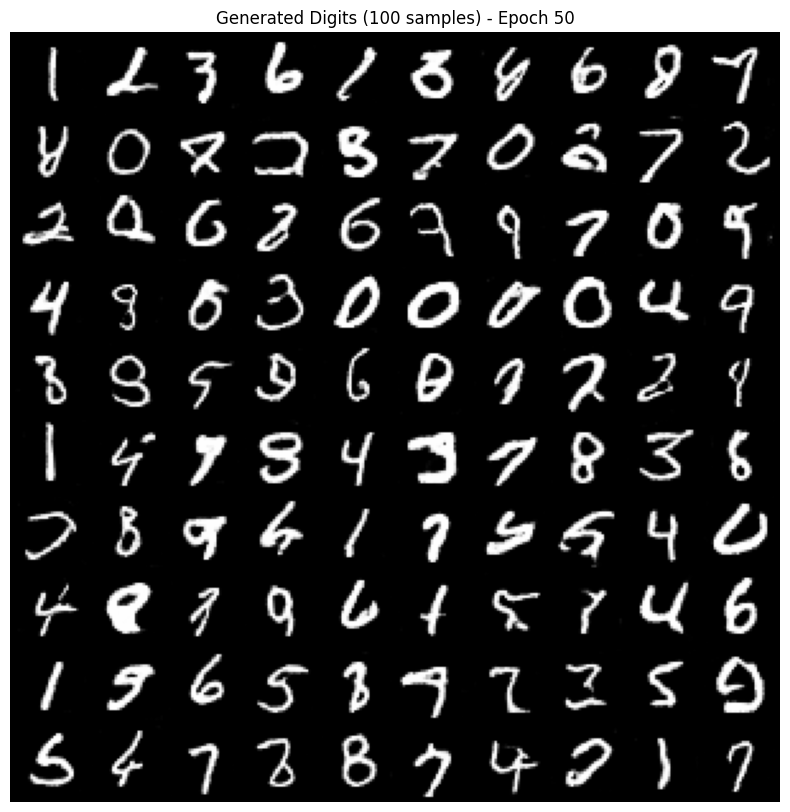

In [ ]:
for epoch in range(1, num_epochs + 1):
    D_real_correct = 0
    D_fake_correct = 0
    total_real = 0
    total_fake = 0

    running_errD_real = 0.0
    running_errD_fake = 0.0
    running_errG = 0.0

    for i, (imgs, _) in enumerate(train_loader):
        # Update Discriminator
        D.zero_grad()
        real_imgs = imgs.to(device)
        b_size = real_imgs.size(0)
        label_real = torch.full((b_size,), real_label, dtype=torch.float, device=device)
        label_fake = torch.full((b_size,), fake_label, dtype=torch.float, device=device)

        # Train on real images
        output_real = D(real_imgs).view(-1)
        errD_real = criterion(output_real, label_real)
        errD_real.backward()
        running_errD_real += errD_real.item() * b_size

        # Accuracy on real images
        preds_real = (output_real >= 0.5).float()
        D_real_correct += (preds_real == label_real).sum().item()
        total_real += b_size

        # Train on fake images
        z = Variable(torch.randn(b_size, z_dim).to(device))
        fake = G(z)
        output_fake = D(fake.detach()).view(-1)
        errD_fake = criterion(output_fake, label_fake)
        errD_fake.backward()
        optimizerD.step()
        running_errD_fake += errD_fake.item() * b_size

        # Accuracy on fake images
        preds_fake = (output_fake < 0.5).float()
        D_fake_correct += (preds_fake == label_fake).sum().item()
        total_fake += b_size

        # Update Generator
        G.zero_grad()
        label_gen = torch.full((b_size,), real_label, dtype=torch.float, device=device)  # trick D
        output_gen = D(fake).view(-1)
        errG = criterion(output_gen, label_gen)
        errG.backward()
        optimizerG.step()
        running_errG += errG.item() * b_size

    # Compute average losses over epoch
    avg_errD_real = running_errD_real / total_real
    avg_errD_fake = running_errD_fake / total_fake
    avg_errG = running_errG / total_fake  # same total_fake for generator batches

    # Compute accuracies
    acc_real = 100 * D_real_correct / total_real
    acc_fake = 100 * D_fake_correct / total_fake

    print(f"Epoch [{epoch}/{num_epochs}] "
          f"Loss_D(real): {avg_errD_real:.4f} Loss_D(fake): {avg_errD_fake:.4f} Loss_G: {avg_errG:.4f} "
          f"Acc Real: {acc_real:.2f}% Acc Fake: {acc_fake:.2f}%")

    # Preview 100 generated digits in a 10x10 grid
    with torch.no_grad():
        fake_samples_100 = G(fixed_noise).detach().cpu()
    grid_100 = utils.make_grid(fake_samples_100, nrow=10, normalize=True)
    plt.figure(figsize=(10,10))
    plt.axis("off")
    plt.title(f"Generated Digits (100 samples) - Epoch {epoch}")
    plt.imshow(grid_100.permute(1, 2, 0).numpy())
    plt.show()


In [ ]:
from google.colab import drive
import pickle

# 1. Mount Google Drive
drive.mount('/content/drive')

# 2. Define your target folder in Google Drive
drive_path = '/content/drive/MyDrive/Advanced_ML'

# 3. Save models directly into Drive
with open(f'{drive_path}/G.pkl', 'wb') as f:
    pickle.dump(G.state_dict(), f)

with open(f'{drive_path}/D.pkl', 'wb') as f:
    pickle.dump(D.state_dict(), f)

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


Mounted at /content/drive


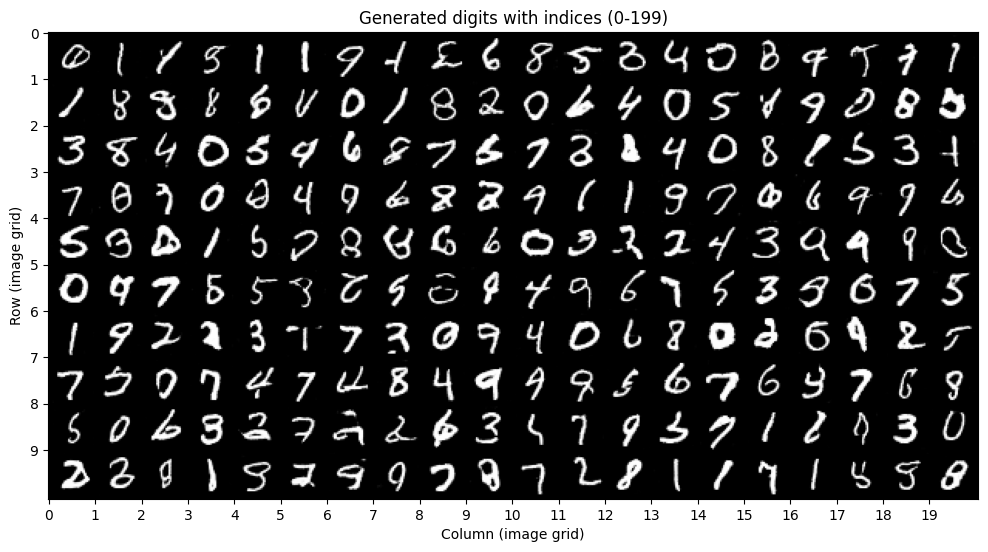

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

import numpy as np

output_dir = "/content/drive/MyDrive/Fake_Digits"
os.makedirs(output_dir, exist_ok=True)

total_generate = 200  # Generate 200 digits at once

# Generate latent vectors and fake images
z_samples_all = torch.randn(total_generate, z_dim).to(device)

with torch.no_grad():
    fake_images_all = G(z_samples_all).cpu()

fake_images_all = (fake_images_all + 1) / 2  # denormalize to [0,1]

nrow = 20  # images per row (adjusted for 200 images)
ncol = total_generate // nrow  # number of rows (10)

# Display all generated digits with their indices
grid = utils.make_grid(fake_images_all, nrow=nrow, normalize=True)
plt.figure(figsize=(12, 8))
plt.title("Generated digits with indices (0-199)")
plt.imshow(grid.permute(1, 2, 0).numpy())

# Turn on axes and set ticks
plt.axis('on')

# Set ticks to correspond to image columns and rows
plt.xticks(ticks=np.arange(0, nrow) * (grid.shape[2] // nrow), labels=np.arange(0, nrow))
plt.yticks(ticks=np.arange(0, ncol) * (grid.shape[1] // ncol), labels=np.arange(0, ncol))

plt.xlabel("Column (image grid)")
plt.ylabel("Row (image grid)")

plt.show()

In [ ]:
selected_indices = [
    1,4,5,6,9,10,11,12,13,14,15,16,19,20,21,24,26,27,28,29,31,32,34,36,37,38,
    40,41,43,44,45,48,53,54,55,58,60,65,66,70,72,73,74,80,81,83,89,93,94,95,
    100,102,104,112,114,115,118,120,121,122,124,126,128,139,131,133,140,142,
    144,145,146,147,148,149,153,154,155,157,158,161,163,165,169,171,172,173,
    175,178,179,183,185,187,190,191,192,193,194,195,196,197,199
]

for idx, i in enumerate(selected_indices):
    img_path = os.path.join(output_dir, f"fake_{idx:03d}.png")
    save_image(fake_images_all[i], img_path)

    z_path = os.path.join(output_dir, f"fake_{idx:03d}.txt")
    np.savetxt(z_path, z_samples_all[i].cpu().numpy())

print(f"Saved {len(selected_indices)} selected fake images and latent vectors to '{output_dir}'")


In [ ]:
with open(f'{drive_path}/G.pkl', 'wb') as f:
    pickle.dump(G.state_dict(), f)

with open(f'{drive_path}/D.pkl', 'wb') as f:
    pickle.dump(D.state_dict(), f)


In [ ]:
#  Install & Import Dependencies
import torch
import torch.nn as nn
import torch.optim as optim
import torch.nn.functional as F
from torchvision import datasets, transforms
from torch.utils.data import DataLoader

# Check GPU
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print("Using device:", device)

#  Transformations
transform = transforms.Compose([
    transforms.ToTensor(),
    transforms.Normalize((0.5,), (0.5,))
])

#  Load Dataset
train_dataset = datasets.MNIST(root='./data', train=True, download=True, transform=transform)
test_dataset = datasets.MNIST(root='./data', train=False, download=True, transform=transform)

train_loader = DataLoader(train_dataset, batch_size=64, shuffle=True)
test_loader = DataLoader(test_dataset, batch_size=64, shuffle=False)

#  Define CNN Model
class CNNClassifier(nn.Module):
    def __init__(self):
        super(CNNClassifier, self).__init__()
        self.conv1 = nn.Conv2d(1, 32, 3, padding=1)
        self.conv2 = nn.Conv2d(32, 64, 3, padding=1)
        self.pool = nn.MaxPool2d(2, 2)
        self.fc1 = nn.Linear(64 * 7 * 7, 128)
        self.fc2 = nn.Linear(128, 10)

    def forward(self, x):
        x = self.pool(F.relu(self.conv1(x)))
        x = self.pool(F.relu(self.conv2(x)))
        x = x.view(-1, 64 * 7 * 7)
        x = F.relu(self.fc1(x))
        x = self.fc2(x)
        return x

model = CNNClassifier().to(device)

#  Loss & Optimizer
criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(model.parameters(), lr=0.001)

#  Training Loop
epochs = 5
for epoch in range(epochs):
    model.train()
    correct, total = 0, 0
    for images, labels in train_loader:
        images, labels = images.to(device), labels.to(device)

        optimizer.zero_grad()
        outputs = model(images)
        loss = criterion(outputs, labels)
        loss.backward()
        optimizer.step()

        _, predicted = torch.max(outputs.data, 1)
        total += labels.size(0)
        correct += (predicted == labels).sum().item()

    train_acc = 100 * correct / total
    print(f"Epoch [{epoch+1}/{epochs}], Training Accuracy: {train_acc:.2f}%")

#  Testing Accuracy
model.eval()
correct, total = 0, 0
with torch.no_grad():
    for images, labels in test_loader:
        images, labels = images.to(device), labels.to(device)
        outputs = model(images)
        _, predicted = torch.max(outputs.data, 1)
        total += labels.size(0)
        correct += (predicted == labels).sum().item()

test_acc = 100 * correct / total
print(f"\nFinal Testing Accuracy: {test_acc:.2f}%")


Using device: cuda
Epoch [1/5], Training Accuracy: 95.23%
Epoch [2/5], Training Accuracy: 98.64%
Epoch [3/5], Training Accuracy: 99.02%
Epoch [4/5], Training Accuracy: 99.26%
Epoch [5/5], Training Accuracy: 99.46%

Final Testing Accuracy: 99.10%


In [ ]:
import os
import shutil
from PIL import Image
import torch
from torchvision import transforms

# Paths
fake_dir = "/content/drive/MyDrive/Fake_Digits" # This should be the same as output_dir in the previous cell JvIlM2rlPB4x
sorted_dir = "/content/drive/MyDrive/Fake_Digits_Sorted"
os.makedirs(sorted_dir, exist_ok=True)

# Create class folders
for label in range(10):
    os.makedirs(os.path.join(sorted_dir, str(label)), exist_ok=True)

# Transform for CNN
transform = transforms.Compose([
    transforms.Grayscale(),  # ensure single channel
    transforms.ToTensor(),
])

# Use your trained CNN model (must already be on device)


with torch.no_grad():
    for file_name in sorted(os.listdir(fake_dir)):
        if file_name.endswith(".png"):
            # Load image
            img_path = os.path.join(fake_dir, file_name)
            img = Image.open(img_path).convert("L")
            img_tensor = transform(img).unsqueeze(0).to(device)  # shape: [1,1,28,28]

            # Predict with CNN
            output = model(img_tensor)
            pred_label = torch.argmax(output, dim=1).item()

            # Paths
            txt_path = os.path.join(fake_dir, file_name.replace(".png", ".txt"))

            # Move files to label folder
            shutil.copy(img_path, os.path.join(sorted_dir, str(pred_label), file_name))
            if os.path.exists(txt_path):
                shutil.copy(txt_path, os.path.join(sorted_dir, str(pred_label), os.path.basename(txt_path)))

print(f"✅ All fake digits sorted into '{sorted_dir}' by predicted label.")

FileNotFoundError: [Errno 2] No such file or directory: '/content/drive/MyDrive/Fake_Digits'